In [ ]:
# Identify whether a CUDA-enabled GPU is available
import torch
import pickle
import os
import sys

sys.path.append("../..")

device = "cuda"

data_home = "../../artefacts/data"
with open(os.path.join(data_home, "train_dataset_5sec.pkl"), "rb") as f:
    train_dataset = pickle.load(f)

with open(os.path.join(data_home, "valid_dataset.pkl"), "rb") as f:
    valid_dataset = pickle.load(f)

meta_information = train_dataset.get_metadata()
SFREQ = 100

In [2]:
meta_information_valid = valid_dataset.get_metadata()
meta_information_valid['target'].std()

0.4054443745531052

### training pipeline

In [3]:
import torch

def soft_label_1d(
    y_sec: torch.Tensor,
    T: int,
    dt: float,
    sigma: float | torch.Tensor = 0.12,
    density: bool = True,
    eps: float = 1e-8,
) -> torch.Tensor:
    y_sec = y_sec.to(torch.float32).view(-1)                 # (B,)
    B = y_sec.numel()
    device = y_sec.device
    u_star = (y_sec / dt).clamp(0.0, T - 1e-6).unsqueeze(1)  # (B,1)
    grid = torch.arange(T, device=device, dtype=torch.float32).unsqueeze(0)  # (1,T)
    rel_sec = (grid - u_star) * dt                           # (B,T)
    if not torch.is_tensor(sigma):
        sigma = torch.tensor(float(sigma), device=device, dtype=torch.float32)
    sigma = sigma.to(torch.float32)
    sigma = sigma.view(-1, 1) if sigma.numel() > 1 else sigma.view(1, 1)
    if sigma.numel() == 1:
        sigma = sigma.expand(B, 1)                           # (B,1)
    q = torch.exp(-0.5 * (rel_sec / sigma).pow(2))           # (B,T)
    if density:
        q = q / (q.sum(dim=1, keepdim=True) + eps)
    else:
        q = q / q.amax(dim=1, keepdim=True).clamp_min(eps)
        idx = u_star.round().long().clamp_(0, T - 1).squeeze(1)
        q[torch.arange(B, device=device), idx] = 1.0
        q.clamp_(0, 1)
    return q

In [4]:
from torch.utils.data import Dataset
import random
import numpy as np
from torch.nn import functional as F

class TrainCroppingDataset(Dataset):
    """
    base[i] -> (X_full, y_abs), X_full: (C, T_full), y_abs: seconds from stimulus.
    Returns: X_crop (C,T_crop), q (T_crop,), y_rel_sec (scalar)
    """
    def __init__(
        self,
        base: Dataset,
        sfreq: float,
        crop_sec: float = 2.0,
        sigma: float = 0.12,
        cropping_offset: float = 0.2,
        crop_proba: float = 1.,
        dropout_range: float = 0.2,
        dropout_proba: float = 0.5,
        use_channels: list | None = None,
        end_time: float | None = None,
        use_augmentation: bool = False,
        
    ):
        self.base = base
        self.sfreq = float(sfreq)
        self.crop_sec = float(crop_sec)
        self.T_crop = int(round(self.crop_sec * self.sfreq))
        self.sigma = float(sigma)
        self.cropping_offset = cropping_offset
        self.crop_proba = crop_proba
        self.dropout_proba = dropout_proba
        self.dropout_range = dropout_range
        self.use_channels = use_channels
        self.end_time = end_time
        self.use_augmentation = use_augmentation
        self.dt = 1.0 / self.sfreq

    def __len__(self):
        return len(self.base)

    def _crop_segment(self, X_full, y_abs):
        """
        Crops a 2-second window that starts around the default 0.5 s offset
        with a random shift in [−cropping_offset, +cropping_offset] seconds.
        """
        if torch.rand((), device=X_full.device) < self.crop_proba:
            start_second = 0.5 + random.uniform(-self.cropping_offset, self.cropping_offset)  # e.g. −0.2…+0.2 s     
            start_second = max(start_second, y_abs - 2.)
            start_second = min(start_second, y_abs - self.cropping_offset) 
            start_second = np.clip(start_second, 0.5 - self.cropping_offset, 0.5 + self.cropping_offset)
            start_second = np.clip(start_second, 0, self.end_time - self.crop_sec)
        else:
            start_second = 0.5      
        start_point = int(round(start_second * self.sfreq))
        end_point = start_point + self.T_crop

        X_crop = X_full[:, start_point:end_point].contiguous().to(torch.float32)
        y_rel_sec = y_abs - start_second #target position in seconds from crop start
        return X_crop, y_rel_sec
    
    
    def _augment_segment(self, X: torch.Tensor, y_rel_sec: float):
        # X: (C,T), y_rel_sec: float in [0, crop_sec]
        C, T = X.shape

        # time scaling
        if torch.rand((), device=X.device) < 0.2:  # вероятность применить
            min_scale, max_scale = 0.8, 1.2        # ±20%
            eps = 1e-6

            lb = max(min_scale, (y_rel_sec / self.crop_sec) + eps)
            ub = max_scale
            scale = 1.0 if lb > ub else float(torch.empty((), device=X.device).uniform_(lb, ub))
            new_T = int(round(T * scale))

            X = F.interpolate(X.unsqueeze(0), size=new_T, mode='linear', align_corners=False).squeeze(0)

            if new_T > T:
                X = X[:, :T]
            elif new_T < T:
                X = F.pad(X, (0, T - new_T))
            y_rel_sec = y_rel_sec / scale

        # channel dropout
        if torch.rand((), device=X.device) < self.dropout_proba:
            # drop up to dropout_range% of channels
            drop = torch.rand((), device=X.device).item() * self.dropout_range
            if drop > 0:
                ch_mask = (torch.rand(C, device=X.device) > drop).to(X.dtype).unsqueeze(-1)  # (C,1)
                X = X * ch_mask

        # cutout
        if torch.rand((), device=X.device) < 0.25:
            seg_len = int(torch.randint(10, min(60, T) + 1, (1,), device=X.device))
            start = int(torch.randint(0, T - seg_len + 1, (1,), device=X.device))
            X[:, start:start + seg_len] = 0

        # gaussian noise
        if torch.rand((), device=X.device) < 0.2:
            noise_std = 0.03 * torch.randn((), device=X.device).abs().item() + 0.01
            X = X + torch.randn_like(X) * noise_std

        return X.contiguous(), y_rel_sec  # y_rel_sec не меняем (нет аугов по времени)

    def __getitem__(self, idx: int):
        batch = self.base[idx]              # expect (X_full, y_abs)
        X_full, y_abs = batch[0], batch[1]

        # to tensors
        X_full = torch.as_tensor(X_full)    # (C, T_full)
        y_abs = float(y_abs.item())

        # channel subset on (C,T)
        if self.use_channels is not None:
            X_full = X_full[self.use_channels, :]

        # optional truncate by end_time (sec)
        if self.end_time is not None:
            t_end = min(X_full.shape[1], int(round(self.end_time * self.sfreq)))
            X_full = X_full[:, :t_end]

        X_crop, y_rel_sec = self._crop_segment(X_full, y_abs)
        if self.use_augmentation:
            X_crop, y_rel_sec = self._augment_segment(X_crop, y_rel_sec)

        q = soft_label_1d(
            torch.tensor([y_rel_sec], dtype=torch.float32),
            T=self.T_crop, dt=self.dt, sigma=self.sigma, density=True
        ).squeeze(0)                         # (T_crop,)

        return X_crop, q, torch.tensor(y_rel_sec, dtype=torch.float32)

In [5]:
from typing import Optional
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.nn import Module
from tqdm import tqdm

def train_one_epoch(
    dataloader: DataLoader,
    model: Module,
    optimizer,
    epoch: int,
    device,
    print_batch_stats: bool = True,
    temperature: float = 1.0,
    lambda_time: float = 1.0,
    lambda_ce: float = 1.0,
    lambda_kl: float = 0.0,
    lambda_wass: float = 0.0,
    lambda_entropy: float = 0.0, #reg term
    lambda_focal: float = 0.0,    # <--- new param
    lambda_hazard: float = 0.0,
    mixup_p: float = 0.5,
    mixup_alpha: float = 0.4,
    grad_accum: int = 1,
):
    """Dataset must yield: X (B,C,T), q (B,T), y_rel (B,) seconds from crop start. model(X)->logits (B,1,T)."""
    model.train()

    total_loss = total_ce = total_rmse = total_kl = total_wass = 0.0
    sse, n_samples = 0.0, 0
    sum_y, sum_y2 = 0.0, 0.0

    n_batches = len(dataloader)
    progress = tqdm(enumerate(dataloader), total=n_batches, disable=not print_batch_stats)

    for i, (X, q, y_rel) in progress:
        X     = X.to(device).float()              # (B,C,T)
        q     = q.to(device).float()              # (B,T) soft distribution over T
        y_rel = y_rel.to(device).float().view(-1) # (B,)

        B, C, T = X.shape
        dt = 1.0 / float(model.sfreq)

        # mixup
        # if torch.rand(()) < mixup_p:
        #     perm = torch.randperm(B, device=X.device)
        #     lam  = torch.distributions.Beta(mixup_alpha, mixup_alpha).sample((B,)).to(X.device)
        #     X     = lam.view(B,1,1)*X     + (1-lam).view(B,1,1)*X[perm]
        #     q     = lam.view(B,1)*q       + (1-lam).view(B,1)*q[perm]
        #     y_rel = lam*y_rel             + (1-lam)*y_rel[perm]
        if mixup_p>0 and torch.rand((),device=X.device)<mixup_p:
            bins=50
            b=torch.clamp((y_rel/(T*dt)*bins).long(),0,bins-1)
            partner=torch.arange(B,device=X.device)
            valid=torch.zeros(B,dtype=torch.bool,device=X.device)
            for k in range(bins):
                g=torch.where(b==k)[0]
                if g.numel()>=2:
                    p=g[torch.randperm(g.numel(),device=X.device)]
                    partner[p]=p.roll(1)
                    valid[p]=True
            if valid.any():
                lam=torch.distributions.Beta(mixup_alpha,mixup_alpha).sample((B,)).to(X.device)
                lam=torch.where(valid,lam,torch.ones_like(lam))
                X=lam.view(-1,1,1)*X+(1-lam).view(-1,1,1)*X[partner]
                q=lam.view(-1,1)*q+(1-lam).view(-1,1)*q[partner]
                y_rel=lam*y_rel+(1-lam)*y_rel[partner]

        z = model(X).squeeze(1)                    # (B,T)

        log_p = F.log_softmax(z / temperature, dim=-1)
        p = torch.softmax(z / temperature, dim=-1)
        entropy = -(p * log_p).sum(dim=-1).mean()   # H(p)

        # focal-weighted CE
        if lambda_ce:
            if lambda_focal > 0:
                focal_weight = (1.0 - p.detach()).pow(lambda_focal)  # detach to avoid 2nd order grads
                ce = -((focal_weight * q) * log_p).sum(dim=-1).mean()
            else:
                ce = -(q * log_p).sum(dim=-1).mean()
        else:
            ce = torch.tensor(0.0, device=device)

        # RMSE (time), KL, WASS
        t_grid = (torch.arange(T, device=device, dtype=z.dtype) * dt)[None, :]
        t_hat = (torch.softmax(z / temperature, dim=-1) * t_grid).sum(dim=-1)
        # ce   = -(q * log_p).sum(dim=-1).mean() if lambda_ce else torch.tensor(0.0, device=device)
        rmse = F.mse_loss(t_hat, y_rel).sqrt()
        kl   = (q * (torch.log(q + 1e-8) - log_p)).sum(dim=-1).mean() if lambda_kl else torch.tensor(0.0, device=device)
        if lambda_wass>0:
            wass = (torch.abs(torch.cumsum(p, -1) - torch.cumsum(q, -1)).sum(-1).mean()) * dt
        else:
            wass = torch.tensor(0.0, device=device)

        base_loss = lambda_ce * ce + lambda_time * rmse + lambda_kl * kl + lambda_wass * wass + lambda_entropy * entropy

        haz_loss = torch.tensor(0.0, device=device)
        t_hat_haz = None
        if lambda_hazard > 0.0:
            # при желании можно завести отдельную температуру для hazard; пока используем ту же
            x = z / temperature
            log_h   = F.logsigmoid(x)    # log σ(x_t)
            log1m_h = F.logsigmoid(-x)   # log (1-σ(x_t)) = log σ(-x_t)
            # sum_{τ<t} log(1-σ(x_τ)) = cumsum - текущий
            log_surv_prev = torch.cumsum(log1m_h, dim=-1) - log1m_h
            log_p_haz = log_h + log_surv_prev
            # ренорм до суммы=1 (устойчиво):
            log_p_haz = log_p_haz - torch.logsumexp(log_p_haz, dim=-1, keepdim=True)
            p_haz = log_p_haz.exp()

            # CE/калибровка для hazard
            if lambda_ce:
                if lambda_focal > 0:
                    focal_w_h = (1.0 - p_haz.detach()).pow(lambda_focal)
                    ce_haz = -((focal_w_h * q) * log_p_haz).sum(dim=-1).mean()
                else:
                    ce_haz = -(q * log_p_haz).sum(dim=-1).mean()
            else:
                ce_haz = torch.tensor(0.0, device=device)

            t_hat_haz = (p_haz * t_grid).sum(dim=-1)
            rmse_haz  = F.mse_loss(t_hat_haz, y_rel).sqrt()
            kl_haz    = (q * (torch.log(q + 1e-8) - log_p_haz)).sum(dim=-1).mean() if lambda_kl else torch.tensor(0.0, device=device)
            wass_haz  = ((torch.abs(torch.cumsum(p_haz, -1) - torch.cumsum(q, -1)).sum(-1).mean()) * dt) if lambda_wass>0 else torch.tensor(0.0, device=device)
            entropy_haz = -(p_haz * log_p_haz).sum(dim=-1).mean()

            haz_loss = (lambda_ce * ce_haz + lambda_time * rmse_haz + lambda_kl * kl_haz + lambda_wass * wass_haz + lambda_entropy * entropy_haz)
        loss = base_loss + lambda_hazard * haz_loss

        # Gradient accumulation
        loss = loss / grad_accum
        loss.backward()
        if (i + 1) % grad_accum == 0 or (i + 1) == n_batches:
            optimizer.step()
            optimizer.zero_grad()

        total_loss += float(loss)
        total_ce   += float(ce)
        total_rmse += float(rmse)
        total_kl   += float(kl)
        total_wass += float(wass)

        diff = (t_hat.detach() - y_rel.detach())
        sse += torch.sum(diff * diff).item()
        n_samples += y_rel.numel()
        sum_y  += y_rel.detach().sum().item()
        sum_y2 += torch.sum(y_rel.detach() * y_rel.detach()).item()

        if print_batch_stats:
            rmse_ds = (sse / max(n_samples, 1)) ** 0.5
            mean_y = sum_y / max(n_samples, 1)
            var_y  = max((sum_y2 / max(n_samples, 1)) - mean_y**2, 1e-12)
            std_y  = var_y ** 0.5
            nrmse  = rmse_ds / std_y
            progress.set_description(
                f"Epoch {epoch} [{i+1}/{n_batches}] "
                f"Loss {loss:.4f} CE {ce:.4f} " 
                f"RMSE {rmse:.4f} KL {kl:.4f} WASS {wass:.4f} "
                f"NRMSE {nrmse:.4f} Entropy {entropy:.3f}"
            )
    rmse_ds  = (sse / max(n_samples, 1)) ** 0.5
    mean_y = sum_y / max(n_samples, 1)
    var_y  = max((sum_y2 / max(n_samples, 1)) - mean_y**2, 1e-12)
    std_y  = var_y ** 0.5
    nrmse  = rmse_ds / std_y

    avg_loss = total_loss / n_batches
    loss_dict = {
        "ce": total_ce / n_batches,
        "rmse": total_rmse / n_batches,
        "kl": total_kl / n_batches,
        "wass": total_wass / n_batches,
        "total": avg_loss,
    }
    print(f"NRMSE: {nrmse:.4f}", f"Total loss: {total_loss:.4f}", f"Total CE: {total_ce:.4f}", f"Total RMSE: {total_rmse:.4f}", f"Total KL: {total_kl:.4f}", f"Total WASS: {total_wass:.4f}")
    return avg_loss, nrmse, loss_dict


In [6]:
import matplotlib.pyplot as plt
import numpy as np

def draw_batch(X, y, z, t_hat_abs, ce, rmse_time, T, dt, win_offset, q, temperature, n_samples=4, rows=2):
    """
    Visualizes batch outputs: predicted distribution, actual value, groundtruth soft label, and losses.

    Args:
        X: Input batch (B, C, T)
        y: Groundtruth absolute times (B,)
        z: logits.squeeze(1) (B, T)
        t_hat_abs: predicted absolute times (B,)
        ce: cross-entropy loss (float)
        rmse_time: regression loss (float)
        T: int, window size (time bins)
        dt: time step (float)
        win_offset: float, window offset
        y_rel: relative click (B,)
        q: soft labels (B, T)
        temperature: softmax temperature
        n_samples: number of samples to plot from batch
        rows: number of rows in grid plot
    """
    b = min(n_samples, X.shape[0])
    # Choose b random sample indices without replacement
    idxs = np.random.choice(X.shape[0], size=b, replace=False)
    cols = int(np.ceil(b / rows))
    plt.figure(figsize=(cols * 5, rows * 2))
    t_grid = (np.arange(T) * dt) + win_offset
    for plot_idx, i in enumerate(idxs):
        plt.subplot(rows, cols, plot_idx + 1)
        p = torch.softmax(z[i] / temperature, dim=-1).cpu().numpy()  # (T,)
        qi = q[i].cpu().numpy()
        plt.plot(t_grid, p, label="Predicted p(t)", color="blue")
        plt.plot(t_grid, qi, label="Soft label $q(t)$", color="green", linestyle="--", alpha=0.8)
        plt.axvline([t_hat_abs[i].cpu().item()], color="red", label="Predicted time", linestyle="--")
        plt.axvline([y[i].cpu().item()], color="black", label="Actual time", linestyle="--")
        plt.title(f"Sample {i} | CE: {ce:.3f} | RMSE: {rmse_time:.3f}")
        plt.xlabel("Time (sec)")
        plt.ylabel("Probability / Weight")
        plt.legend()
        plt.tight_layout()
    plt.show()

In [7]:
# import torch
# import torch.nn.functional as F

# from torch.utils.data import DataLoader
# from torch.nn import Module
# from tqdm import tqdm

# @torch.no_grad()
# def valid_model(
#     dataloader: DataLoader,
#     model: Module,
#     device,
#     print_batch_stats: bool = True,
#     channels_list: list = None,
#     default_rmse: float = None,
#     sigma: float = 0.10,
#     temperature: float = 1.0,
#     lambda_time: float = 1.0,
#     win_offset: float = 0.5,
#     use_soft_argmax: bool = True,
#     plot_last_batch: bool = True,
# ):
#     """model(X)->logits (B,1,T); y is click time (sec) from stimulus onset."""
#     model.eval()

#     n_batches = len(dataloader)
#     it = tqdm(enumerate(dataloader), total=n_batches, disable=not print_batch_stats)

#     total_loss = total_ce = total_rmse = 0.0
#     sse_abs = 0.0
#     n_samples = 0
#     preds_abs, targets_abs = [], []

#     for i, batch in it:
#         X = batch[0].to(device).float()
#         y = batch[1].to(device).float().view(-1)             # absolute times (B,)
#         if channels_list is not None:
#             X = X[:, channels_list, :]
        
#         B, C, T = X.shape
#         dt = 1.0 / float(model.sfreq)
#         win_sec = T * dt

#         # build soft labels in window coords
#         y_rel = (y - win_offset).clamp(0.0, win_sec)
#         q = soft_label_1d(y_rel, T=T, dt=dt, sigma=sigma, density=True)  # (B,T)

#         logits = model(X)                 # (B,1,T)
#         z = logits.squeeze(1)             # (B,T)

#         # segmentation loss
#         log_p = F.log_softmax(z / temperature, dim=-1)
#         ce = -(q * log_p).sum(dim=-1).mean()

#         # soft-argmax prediction (window coords) -> absolute
#         if use_soft_argmax:
#             t_grid = (torch.arange(T, device=device, dtype=z.dtype) * dt)[None, :]
#             p = torch.softmax(z / temperature, dim=-1)
#             t_hat_rel = (p * t_grid).sum(dim=-1)          # (B,)
#             t_hat_abs = t_hat_rel + win_offset            # (B,)
#         else:
#             t_hat_abs = z.argmax(dim=-1) * dt + win_offset  # (B,)
  
#         # regression loss in SAME frame as y (absolute)
#         rmse_time = F.mse_loss(t_hat_abs, y).sqrt()
#         loss = ce + lambda_time * rmse_time

#         # accumulate
#         total_loss += float(loss)
#         total_ce += float(ce)
#         total_rmse += float(rmse_time)

#         diff_abs = (t_hat_abs - y).detach()
#         sse_abs += torch.sum(diff_abs * diff_abs).item()
#         n_samples += y.numel()

#         preds_abs.extend(t_hat_abs.cpu().numpy())
#         targets_abs.extend(y.cpu().numpy())

#         if print_batch_stats:
#             rmse = (sse_abs / max(n_samples, 1)) ** 0.5
#             nrmse = rmse / default_rmse if default_rmse else rmse
#             it.set_description(
#                 f"Val [{i+1}/{n_batches}] Loss {loss:.4f} CE {ce:.4f} RMSE {rmse_time:.4f} NRMSE {nrmse:.4f}"
#             )
#     avg_loss = total_loss / n_batches if n_batches else float("nan")
#     avg_ce   = total_ce   / n_batches if n_batches else float("nan")
#     avg_rmse  = total_rmse  / n_batches if n_batches else float("nan")
#     rmse = (sse_abs / max(n_samples, 1)) ** 0.5 * 1000
#     nrmse = rmse / default_rmse if default_rmse else rmse

#     print(f"Val NRMSE: {nrmse:.3f}, Val Loss: {avg_loss:.6f}, Val CE: {avg_ce:.6f}, Val RMSE: {avg_rmse:.6f}")
#     bias = (t_hat_abs - y).mean().item()
#     print("mean bias (s):", bias)
#     # Visualization: Draw last batch distributions for n_samples=4, 2 rows
#     if plot_last_batch:
#         draw_batch(
#             X=X.cpu(),
#             y=y.cpu(),
#             z=z.cpu(),
#             t_hat_abs=t_hat_abs.cpu(),
#             ce=float(ce),
#             rmse_time= float(rmse_time),
#             T= T,
#             dt= dt,
#             win_offset= win_offset,
#             q= q.cpu(),
#             temperature= temperature,
#         )

#     return np.array(preds_abs), avg_loss, nrmse, avg_ce, avg_rmse


In [8]:
import torch
import torch.nn.functional as F
import numpy as np
from torch.utils.data import DataLoader
from torch.nn import Module
from tqdm import tqdm

@torch.no_grad()
def valid_model(
    dataloader: DataLoader,
    model: Module,
    device,
    print_batch_stats: bool = True,
    channels_list: list = None,
    default_rmse: float = None,
    sigma: float = 0.10,
    temperature: float = 1.0,
    lambda_time: float = 1.0,
    win_offset: float = 0.5,
    use_soft_argmax: bool = True,
    plot_last_batch: bool = True,
    calibrate_temperature: bool = True,
    tau_min: float = 0.3,
    tau_max: float = 1.5,
    tau_steps: int = 25,
):
    """model(X)->logits (B,1,T); y is click time (sec) from stimulus onset.
       Калибрует τ по RMSE, печатает и возвращает лучшую τ."""
    model.eval()

    n_batches = len(dataloader)
    it = tqdm(enumerate(dataloader), total=n_batches, disable=not print_batch_stats)

    total_ce = 0.0
    n_samples = 0

    # сетка температур для калибровки RMSE (только если soft-argmax)
    do_calib = use_soft_argmax and calibrate_temperature
    if do_calib:
        taus = torch.linspace(tau_min, tau_max, tau_steps, device=device)
        sse_grid = torch.zeros(taus.numel(), dtype=torch.float64, device=device)
        sumdiff_grid = torch.zeros_like(sse_grid)  # для bias, если полезно
    else:
        taus = torch.tensor([temperature], device=device)
        sse_grid = torch.zeros(1, dtype=torch.float64, device=device)
        sumdiff_grid = torch.zeros(1, dtype=torch.float64, device=device)

    # сохраним последний батч для отрисовки с лучшей τ
    last = {}

    for i, batch in it:
        X = batch[0].to(device).float()
        y = batch[1].to(device).float().view(-1)
        if channels_list is not None:
            X = X[:, channels_list, :]

        B, C, T = X.shape
        dt = 1.0 / float(model.sfreq)
        max_t = (T - 1) * dt

        y_rel = (y - win_offset).clamp(0.0, max_t)
        q = soft_label_1d(y_rel, T=T, dt=dt, sigma=sigma, density=True).to(X.dtype)

        z = model(X).squeeze(1)  # (B,T)

        # CE считаем на исходной temperature (как раньше)
        log_p_ce = F.log_softmax(z / temperature, dim=-1)
        ce = -(q * log_p_ce).sum(dim=-1).mean()
        total_ce += float(ce)

        # обновим RMSE для всех τ из сетки (по soft-argmax)
        t_grid = (torch.arange(T, device=device, dtype=z.dtype) * dt)[None, :]
        for k, tau in enumerate(taus):
            p = torch.softmax(z / tau, dim=-1)
            t_hat_abs = (p * t_grid).sum(dim=-1) + win_offset
            diff = (t_hat_abs - y).to(torch.float64)
            sse_grid[k] += torch.sum(diff * diff)
            sumdiff_grid[k] += diff.sum()

        n_samples += y.numel()

        if plot_last_batch:
            last = dict(X=X.detach().cpu(), y=y.detach().cpu(), z=z.detach().cpu(),
                        q=q.detach().cpu(), T=T, dt=dt, win_offset=win_offset)

        if print_batch_stats:
            # временный RMSE на текущей τ для мониторинга
            idx_tmp = (taus - temperature).abs().argmin().item()
            rmse_tmp = (sse_grid[idx_tmp].item() / max(n_samples, 1)) ** 0.5
            nrmse_tmp = rmse_tmp / default_rmse if default_rmse else rmse_tmp
            it.set_description(
                f"Val [{i+1}/{n_batches}] CE {ce:.4f} RMSE@τ={float(temperature):.2f} {rmse_tmp:.4f} "
                f"NRMSE {nrmse_tmp:.4f}"
            )

    # выбор лучшей τ по RMSE
    rmse_grid = torch.sqrt(sse_grid / max(n_samples, 1)).cpu().numpy()
    best_idx = int(np.argmin(rmse_grid))
    best_tau = float(taus[best_idx].item())
    best_rmse = float(rmse_grid[best_idx])
    best_bias = float((sumdiff_grid[best_idx] / max(n_samples, 1)).item())

    # финальные метрики
    avg_ce = total_ce / n_batches if n_batches else float("nan")
    avg_loss = avg_ce + lambda_time * best_rmse
    rmse_ms = best_rmse * 1000.0
    nrmse = rmse_ms / default_rmse if default_rmse else rmse_ms

    print(f"Val (τ*) {best_tau:.3f} | NRMSE: {nrmse:.3f}, CE: {avg_ce:.6f}, RMSE(s): {best_rmse:.6f}, bias(s): {best_bias:.6f}")

    # второй проход только для получения предсказаний при лучшей τ
    preds_abs = []
    if use_soft_argmax:
        for batch in dataloader:
            X = batch[0].to(device).float()
            if channels_list is not None:
                X = X[:, channels_list, :]
            z = model(X).squeeze(1)
            T = z.shape[-1]
            dt = 1.0 / float(model.sfreq)
            t_grid = (torch.arange(T, device=device, dtype=z.dtype) * dt)[None, :]
            p = torch.softmax(z / best_tau, dim=-1)
            t_hat_abs = (p * t_grid).sum(dim=-1) + win_offset
            preds_abs.extend(t_hat_abs.detach().cpu().numpy())
    else:
        # argmax: не зависит от τ
        for batch in dataloader:
            X = batch[0].to(device).float()
            if channels_list is not None:
                X = X[:, channels_list, :]
            z = model(X).squeeze(1)
            dt = 1.0 / float(model.sfreq)
            preds_abs.extend((z.argmax(dim=-1) * dt + win_offset).detach().cpu().numpy())

    # график последнего батча — с лучшей τ
    if plot_last_batch and last:
        z_cpu = last["z"]
        T = last["T"]; dt = last["dt"]; win_offset = last["win_offset"]
        t_grid = (torch.arange(T, dtype=z_cpu.dtype).unsqueeze(0) * dt)
        p_plot = torch.softmax(z_cpu / best_tau, dim=-1)
        t_hat_abs_plot = (p_plot * t_grid).sum(dim=-1) + win_offset
        draw_batch(
            X=last["X"], y=last["y"], z=z_cpu, t_hat_abs=t_hat_abs_plot,
            ce=avg_ce, rmse_time=best_rmse, T=T, dt=dt, win_offset=win_offset,
            q=last["q"], temperature=best_tau,
        )

    return np.array(preds_abs), avg_loss, nrmse, avg_ce, best_rmse, best_tau


In [9]:
from torch.utils.data import DataLoader
from pkg.models.factorization_unet import FactorizationSneddyUnet
from pkg.models.sneddy_unet import SneddySegUNet1D
from pkg.models.reccurent_unet import RecurrentSneddyUnet
from pkg.models.simple_tcn import SepTCNSegmenter1D
from pkg.models.inception import EEGInceptionSeg1D
from pkg.models.attention_sneddy_unet import AttentionSneddyUnet

n_epochs = 200
early_stopping_patience = 20
# channels_list = [idx for idx in range(128) if idx not in (9, 121)]
channels_list = np.arange(128)
num_workers = 4

valid_loader = DataLoader(valid_dataset, batch_size=256, shuffle=False, num_workers=num_workers)

# attention_unet_v2 - 901.512
# attention_unet_v4 - 901.503
# model = AttentionSneddyUnet(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, num_stages=5, widen=2.0, depth_per_stage=[2,2,2,1,1],
#     bottleneck_type="mhsa", bottleneck_depth=3,
#     attn_heads=4, attn_dropout=0.05, ffn_dropout=0.05,
#     drop_path=0.1, skip_gating=True, use_norm=True
# )
# input_checkpoint_path = "../artefacts/models/challenge_1/attention_unet_v4.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/attention_unet_v5.pth"

# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, widen=4, depth_per_stage=8, dropout=0.05, k=15,
#     out_channels=1
# ).to(device)
# input_checkpoint_path = "../artefacts/models/challenge_1/unet_deeper_depth8_v0.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/unet_deeper_depth8_v0.pth"

# unet_deeper_widen4_v0 - 903.4
# unet_deeper_widen4_v1 - 902.532
# unet_deeper_widen4_v2 - 902.365
# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, widen=4, depth_per_stage=5, dropout=0.05, k=15,
#     out_channels=1
# ).to(device)
# input_checkpoint_path = "../artefacts/models/challenge_1/unet_deeper_widen4_v11_hard.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/unet_deeper_widen4_v11_hard.pth"

# # unet_deeper_v0 - 903.320
# # unet_deeper_v1 - 901.810
# # unet_deeper_v3 - 899.418
# # unet_deeper_v4 - 898.943
# # unet_deeper_v5 - 898.406
# # unet_deeper_v6 - 897.811
# # unet_deeper_v7 - 898.393 (from v4) with only rmse loss
# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=96, widen=2, depth_per_stage=5, dropout=0.2, k=15,
#     out_channels=1
# ).to(device)
# input_checkpoint_path = "../artefacts/models/challenge_1/unet_deeper_v6.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/unet_deeper_v61.pth"

# unet_depth10_v0 - 903.699
# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=128, widen=2, depth_per_stage=10, dropout=0.2, k=19,
#     out_channels=1
# ).to(device)
# input_checkpoint_path = "../artefacts/models/challenge_1/unet_depth10_v0.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/unet_depth10_v0.pth"

#№ 903.785
# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=96, widen=2, depth_per_stage=3, dropout=0.05, k=15,
#     out_channels=1, use_norm=True
# ).to(device)
# input_checkpoint_path = "../artefacts/models/challenge_1/unet_v4_nonorm.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/unet_v4_nonorm_v1.pth"

# # 940
# model = SepTCNSegmenter1D(
#     n_chans=128,
#     n_times=200,
#     sfreq=100,
#     c0=64,          # ширина базового канала, как у SneddyNet
#     k=9,           # аналог большого ядра (15 вместо 7)
#     dropout=0.1,   # та же вероятность dropout
#     out_channels=1
# ).to(device)
# input_checkpoint_path = "../artefacts/models/challenge_1/tcn_v0.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/tcn_v0.pth"

## 917
model = EEGInceptionSeg1D(
    n_chans=128, n_times=200, sfreq=100,
    branch_out=32,                  # ~n_filters в оригинале, но уже "после" spatial mix
    scales_samples_s=(0.5, 0.25, 0.125),
    pooling_sizes=(1, 1),           # оставь (1,1) для максимальной точности во времени
    dropout=0.12,
    out_channels=1
).to(device)
input_checkpoint_path = "../artefacts/models/challenge_1/inception_v0.pth"
output_checkpoint_path = "../artefacts/models/challenge_1/inception_v1.pth"

# 910.5
# model = FactorizationSneddyUnet( 
#     n_chans=128, n_times=200, sfreq=100, c0=96, widen=2, 
#     n_stages=4, 
#     depth_per_stage=2, dropout=0.1, k=7, out_channels=1, fm_factors_front=64, fm_dropout_front=0.05, 
#     use_stage_fm=True, 
#     fm_factors_stage=32, fm_dropout_stage=0.05).to(device)
# input_checkpoint_path = "../artefacts/models/challenge_1/factorization_unet_v1_finetune.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/factorization_unet_v2_finetune.pth"

# model_dilated - 910.779
# model = AttentionSneddyUnet(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, widen=2.5, num_stages=5, depth_per_stage=[3,3,2,1,1],
#     bottleneck_type="dilated", bottleneck_depth=5,
#     dropout=0.1, drop_path=0.05, skip_gating=False,
# )
# channels_list = np.arange(128)
# input_checkpoint_path = "../artefacts/models/challenge_1/model_dilated_v2.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/model_dilated_v2.pth"

# rnn_v2 - 909.081 - tau 0.8
# model = RecurrentSneddyUnet(
#     n_chans=len(channels_list), n_times=200, sfreq=100,
#     c0=32, widen=1.5, num_stages=3, depth_per_stage=[1,1,1],
#     k=7, dropout=0.1, drop_path=0.0, skip_gating=False,
#     out_channels=1,
#     # реккурентные опции:
#     rnn_type="gru", bidirectional=True,
#     rnn_hidden_mult=1.0, rnn_layers_per_block=1,
#     bottleneck_type="rnn", bottleneck_depth=2, bottleneck_rnn_layers=1,
#     rnn_dropout=0.05, use_dwpos=True
# )
# input_checkpoint_path = "../artefacts/models/challenge_1/rnn_v2.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/rnn_v2.pth"

# model = AttentionSneddyUnet(
#     n_chans=len(channels_list), n_times=200, sfreq=100,
#     c0=32, widen=1.5, num_stages=3, depth_per_stage=[1,1,1],
#     bottleneck_type="mhsa", bottleneck_depth=2,
#     attn_heads=4, attn_dropout=0.05, ffn_dropout=0.05,
#     dropout=0.1, drop_path=0.0, skip_gating=False,
# )
# input_checkpoint_path = "../artefacts/models/challenge_1/model_light_v2.pth"
# output_checkpoint_path = "../artefacts/models/challenge_1/model_light_v2.pth"

total_params = sum(p.numel() for p in model.parameters())
bytes_total = total_params * 4  # float32 = 4 байта
mb_total = bytes_total / 1024**2
gb_total = bytes_total / 1024**3

print(f"Всего параметров: {total_params:,}")
print(f"Примерный размер модели: {mb_total:.2f} МБ ({gb_total:.3f} ГБ)")

if os.path.exists(input_checkpoint_path):
    model.load_state_dict(torch.load(input_checkpoint_path))
model.to(device)

best_rmse = 1000 
epochs_no_improve = 0
best_state, best_epoch = None, None

default_rmse_valid = meta_information_valid['target'].std()
print(f"STD of target in validation set: {default_rmse_valid:.4f}")

Всего параметров: 156,257
Примерный размер модели: 0.60 МБ (0.001 ГБ)
STD of target in validation set: 0.4054


0.901506
0.901503

Val [91/91] CE 4.6692 RMSE@τ=0.80 0.3734 NRMSE 0.9209: 100%|██████████| 91/91 [00:04<00:00, 20.85it/s]

Val (τ*) 1.150 | NRMSE: 916.921, CE: 4.804997, RMSE(s): 0.371760, bias(s): -0.002194


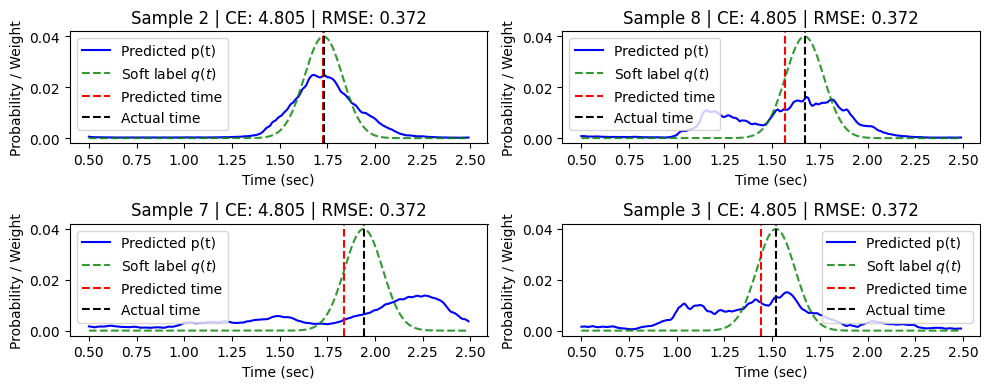

In [10]:
if os.path.exists(input_checkpoint_path):
        val_preds, val_loss, best_rmse, val_ce, val_mse, best_tau = valid_model(
                valid_loader, model, device,
                channels_list=channels_list, default_rmse=default_rmse_valid, 
                use_soft_argmax=True, 
                temperature=0.8, sigma=0.1
        )

Epoch 1/200: 

Epoch 1 [31/31] Loss 5.0604 CE 5.0604 RMSE 0.4077 KL 0.0000 WASS 0.0000 NRMSE 0.9495 Entropy 4.896: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

NRMSE: 0.9495 Total loss: 156.3263 Total CE: 156.3263 Total RMSE: 12.1269 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7500 RMSE@τ=0.75 0.3736 NRMSE 0.9215: 100%|██████████| 91/91 [00:04<00:00, 21.52it/s]

Val (τ*) 0.750 | NRMSE: 921.493, CE: 4.937546, RMSE(s): 0.373614, bias(s): 0.017130


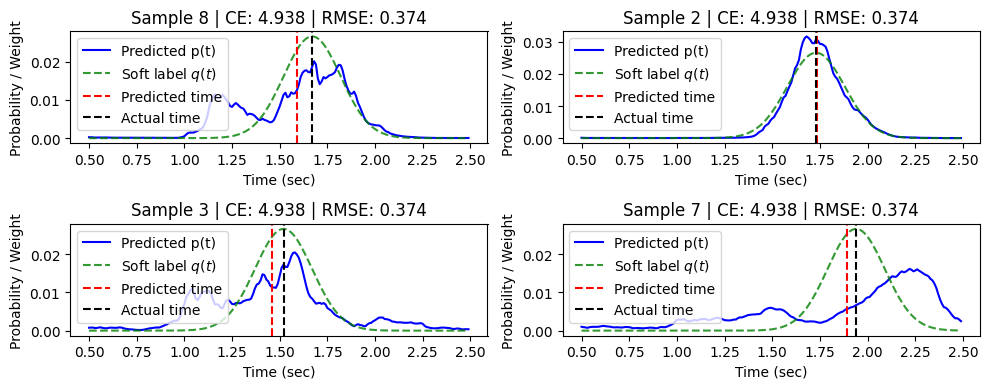

Epoch 2/200: 

Epoch 2 [31/31] Loss 5.0355 CE 5.0355 RMSE 0.3937 KL 0.0000 WASS 0.0000 NRMSE 0.9510 Entropy 4.850: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9510 Total loss: 156.1207 Total CE: 156.1207 Total RMSE: 12.1439 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7349 RMSE@τ=0.75 0.3735 NRMSE 0.9211: 100%|██████████| 91/91 [00:04<00:00, 21.44it/s]

Val (τ*) 0.750 | NRMSE: 921.145, CE: 4.925009, RMSE(s): 0.373473, bias(s): 0.017880


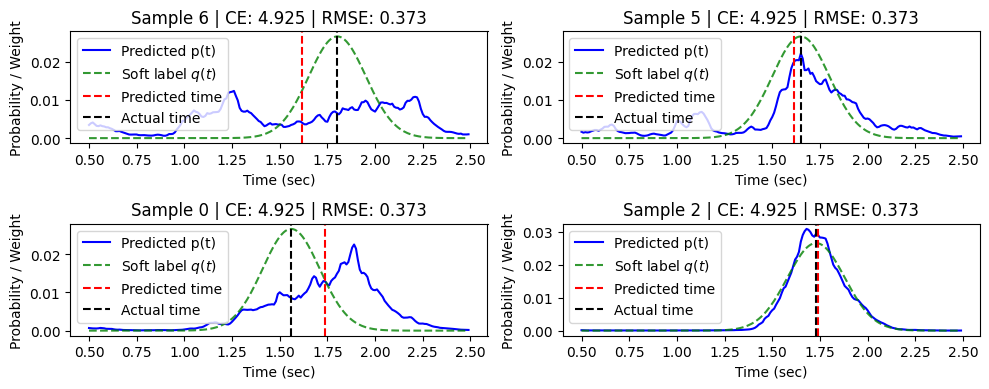

Epoch 3/200: 

Epoch 3 [31/31] Loss 5.0563 CE 5.0563 RMSE 0.3990 KL 0.0000 WASS 0.0000 NRMSE 0.9524 Entropy 4.915: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

NRMSE: 0.9524 Total loss: 155.9778 Total CE: 155.9778 Total RMSE: 12.1687 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7276 RMSE@τ=0.75 0.3734 NRMSE 0.9211: 100%|██████████| 91/91 [00:04<00:00, 21.42it/s]

Val (τ*) 0.750 | NRMSE: 921.077, CE: 4.916537, RMSE(s): 0.373446, bias(s): 0.018302


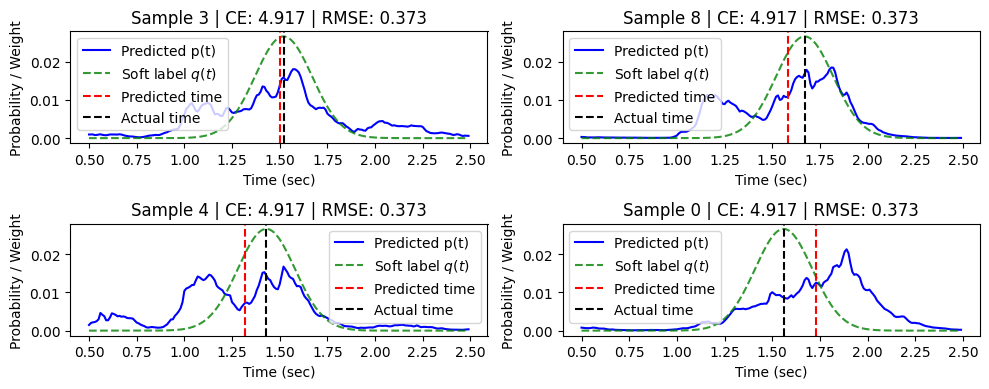

Epoch 4/200: 

Epoch 4 [31/31] Loss 5.0131 CE 5.0131 RMSE 0.3982 KL 0.0000 WASS 0.0000 NRMSE 0.9488 Entropy 4.882: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9488 Total loss: 155.6816 Total CE: 155.6816 Total RMSE: 12.1085 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7255 RMSE@τ=0.75 0.3734 NRMSE 0.9210: 100%|██████████| 91/91 [00:04<00:00, 21.34it/s]

Val (τ*) 0.750 | NRMSE: 921.006, CE: 4.910873, RMSE(s): 0.373417, bias(s): 0.018154


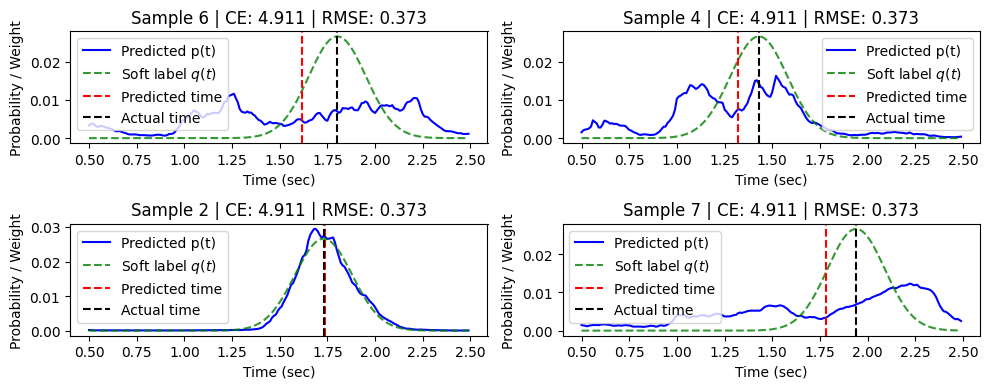

Epoch 5/200: 

Epoch 5 [31/31] Loss 5.0106 CE 5.0106 RMSE 0.3960 KL 0.0000 WASS 0.0000 NRMSE 0.9520 Entropy 4.887: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9520 Total loss: 155.7212 Total CE: 155.7212 Total RMSE: 12.1512 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7242 RMSE@τ=0.75 0.3735 NRMSE 0.9212: 100%|██████████| 91/91 [00:04<00:00, 20.53it/s]

Val (τ*) 0.750 | NRMSE: 921.153, CE: 4.906957, RMSE(s): 0.373476, bias(s): 0.018257


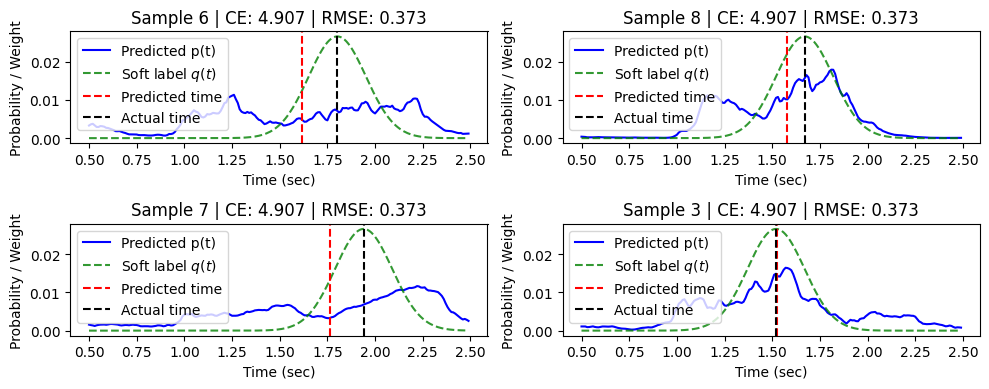

Epoch 6/200: 

Epoch 6 [31/31] Loss 5.0182 CE 5.0182 RMSE 0.3848 KL 0.0000 WASS 0.0000 NRMSE 0.9479 Entropy 4.953: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9479 Total loss: 155.5369 Total CE: 155.5369 Total RMSE: 12.1016 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7248 RMSE@τ=0.75 0.3735 NRMSE 0.9212: 100%|██████████| 91/91 [00:04<00:00, 21.37it/s]

Val (τ*) 0.750 | NRMSE: 921.173, CE: 4.904128, RMSE(s): 0.373484, bias(s): 0.017967


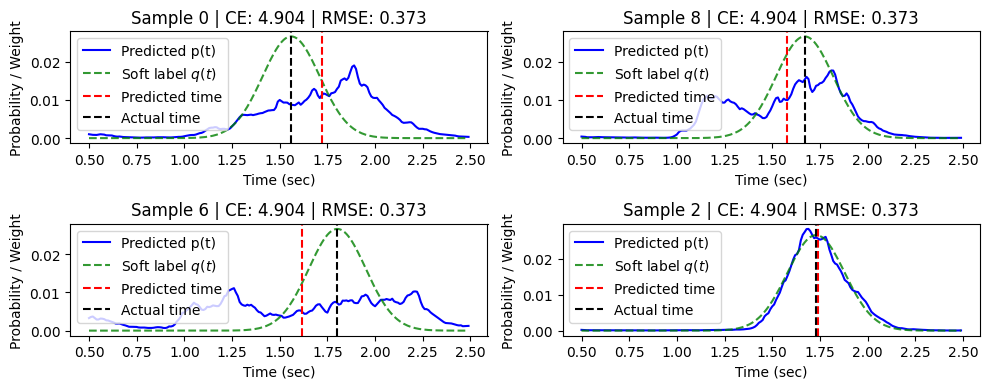

Epoch 7/200: 

Epoch 7 [31/31] Loss 5.0020 CE 5.0020 RMSE 0.3867 KL 0.0000 WASS 0.0000 NRMSE 0.9459 Entropy 4.915: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9459 Total loss: 155.3457 Total CE: 155.3457 Total RMSE: 12.0783 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7266 RMSE@τ=0.75 0.3734 NRMSE 0.9210: 100%|██████████| 91/91 [00:04<00:00, 21.51it/s]

Val (τ*) 0.750 | NRMSE: 920.984, CE: 4.901756, RMSE(s): 0.373408, bias(s): 0.017270


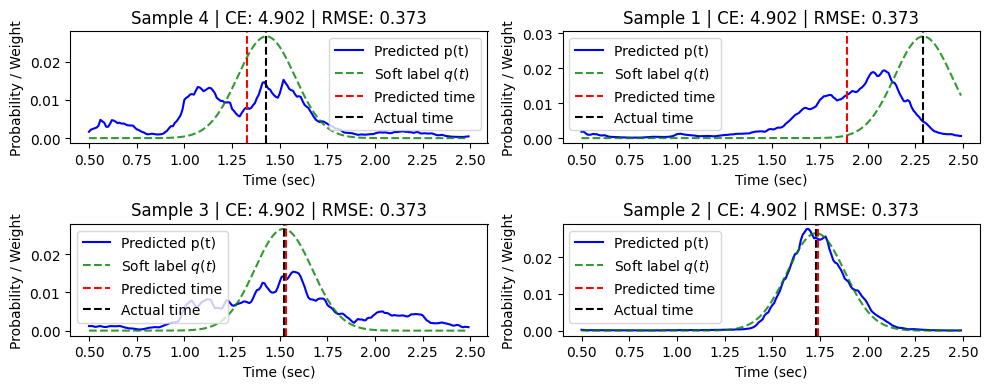

Epoch 8/200: 

Epoch 8 [31/31] Loss 5.0018 CE 5.0018 RMSE 0.3901 KL 0.0000 WASS 0.0000 NRMSE 0.9500 Entropy 4.918: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9500 Total loss: 155.4765 Total CE: 155.4765 Total RMSE: 12.1339 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7277 RMSE@τ=0.75 0.3734 NRMSE 0.9210: 100%|██████████| 91/91 [00:04<00:00, 21.63it/s]

Val (τ*) 0.750 | NRMSE: 921.031, CE: 4.900184, RMSE(s): 0.373427, bias(s): 0.016997


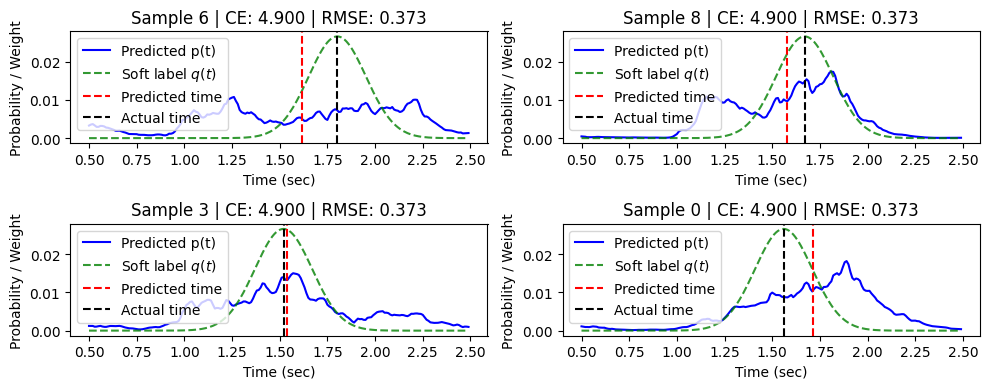

Epoch 9/200: 

Epoch 9 [31/31] Loss 4.9987 CE 4.9987 RMSE 0.3982 KL 0.0000 WASS 0.0000 NRMSE 0.9505 Entropy 4.919: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9505 Total loss: 155.4140 Total CE: 155.4140 Total RMSE: 12.1302 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7288 RMSE@τ=0.75 0.3734 NRMSE 0.9211: 100%|██████████| 91/91 [00:04<00:00, 21.66it/s]

Val (τ*) 0.750 | NRMSE: 921.076, CE: 4.899023, RMSE(s): 0.373445, bias(s): 0.016724


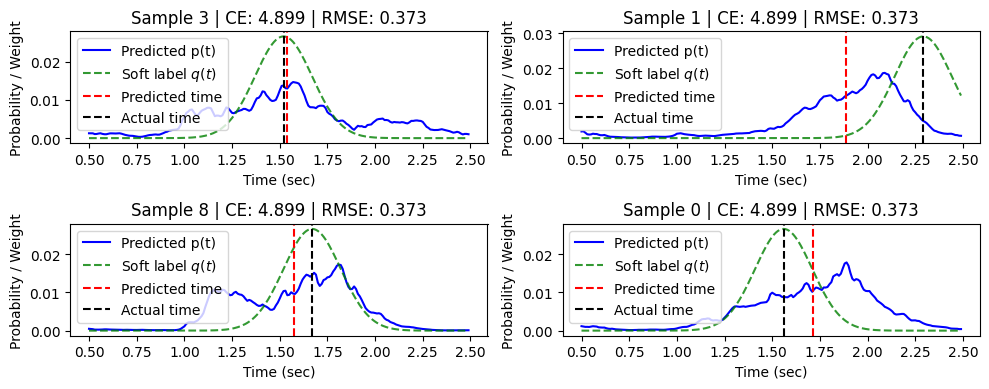

Epoch 10/200: 

Epoch 10 [31/31] Loss 5.0376 CE 5.0376 RMSE 0.3881 KL 0.0000 WASS 0.0000 NRMSE 0.9517 Entropy 4.985: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9517 Total loss: 155.5949 Total CE: 155.5949 Total RMSE: 12.1617 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7298 RMSE@τ=0.75 0.3735 NRMSE 0.9212: 100%|██████████| 91/91 [00:04<00:00, 21.58it/s]

Val (τ*) 0.750 | NRMSE: 921.236, CE: 4.898349, RMSE(s): 0.373510, bias(s): 0.016625


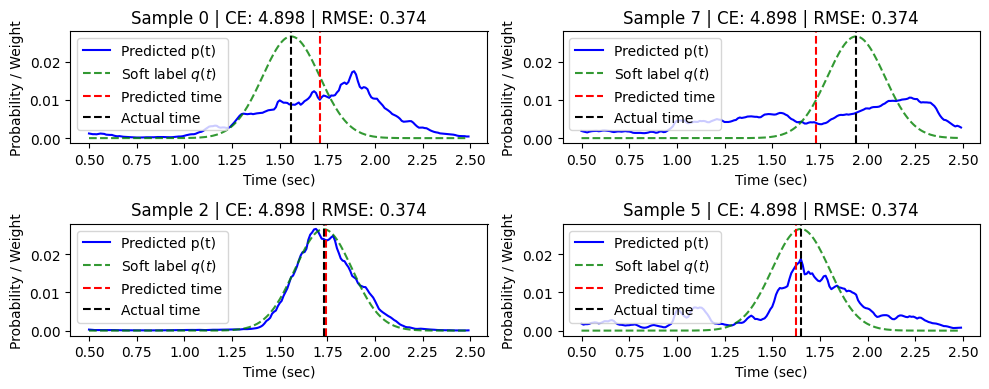

Epoch 11/200: 

Epoch 11 [31/31] Loss 5.0211 CE 5.0211 RMSE 0.3947 KL 0.0000 WASS 0.0000 NRMSE 0.9469 Entropy 4.990: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9469 Total loss: 155.2547 Total CE: 155.2547 Total RMSE: 12.0876 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7308 RMSE@τ=0.75 0.3735 NRMSE 0.9212: 100%|██████████| 91/91 [00:04<00:00, 21.34it/s]

Val (τ*) 0.750 | NRMSE: 921.174, CE: 4.897628, RMSE(s): 0.373485, bias(s): 0.016227


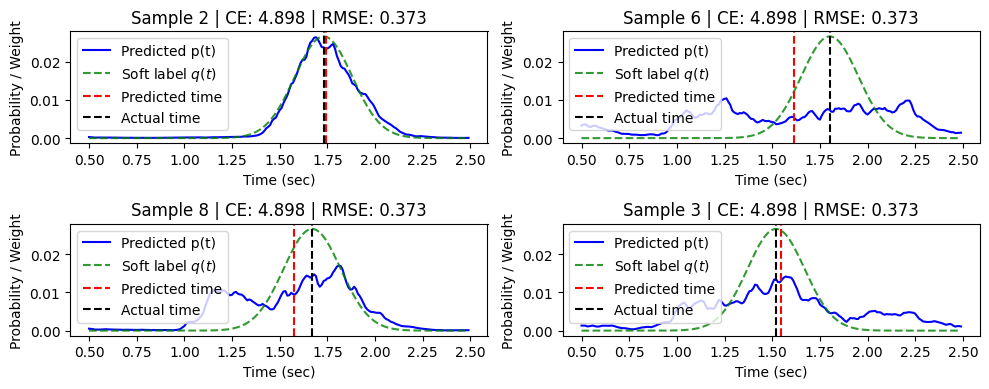

Epoch 12/200: 

Epoch 12 [31/31] Loss 5.0359 CE 5.0359 RMSE 0.4034 KL 0.0000 WASS 0.0000 NRMSE 0.9499 Entropy 4.998: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9499 Total loss: 155.3440 Total CE: 155.3440 Total RMSE: 12.1197 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7315 RMSE@τ=0.75 0.3735 NRMSE 0.9212: 100%|██████████| 91/91 [00:04<00:00, 21.68it/s]

Val (τ*) 0.750 | NRMSE: 921.242, CE: 4.897264, RMSE(s): 0.373512, bias(s): 0.016061


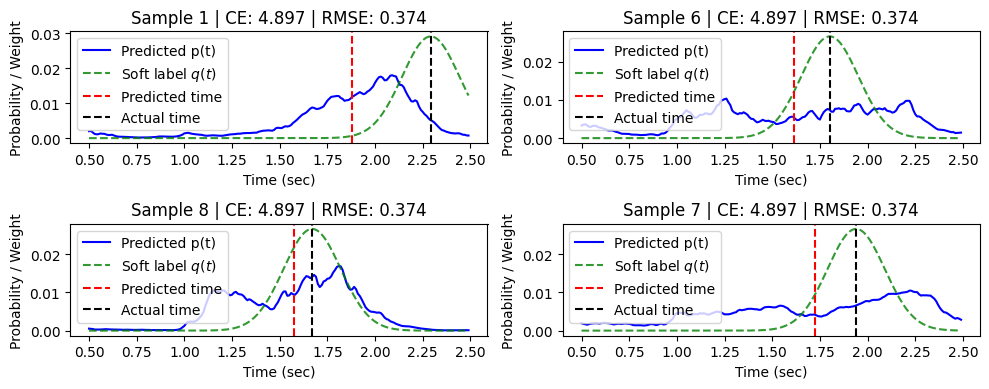

Epoch 13/200: 

Epoch 13 [31/31] Loss 4.9898 CE 4.9898 RMSE 0.3935 KL 0.0000 WASS 0.0000 NRMSE 0.9490 Entropy 4.950: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9490 Total loss: 155.3470 Total CE: 155.3470 Total RMSE: 12.1226 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7322 RMSE@τ=0.75 0.3735 NRMSE 0.9213: 100%|██████████| 91/91 [00:04<00:00, 21.55it/s]

Val (τ*) 0.750 | NRMSE: 921.274, CE: 4.896935, RMSE(s): 0.373526, bias(s): 0.015856


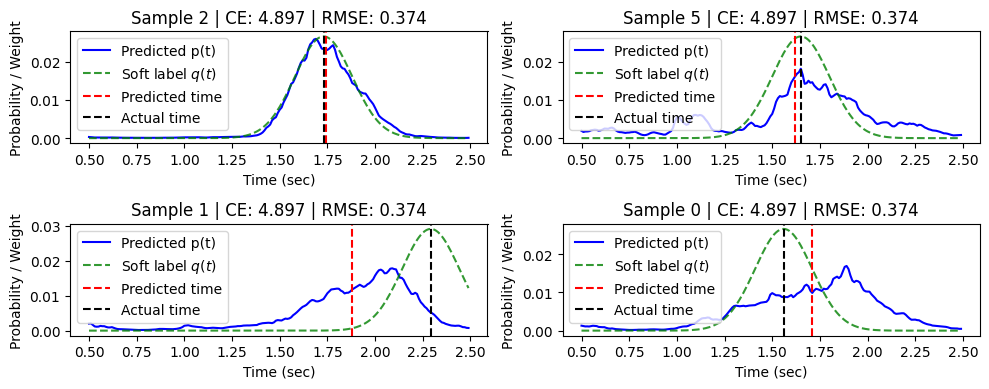

Epoch 14/200: 

Epoch 14 [31/31] Loss 5.0397 CE 5.0397 RMSE 0.4066 KL 0.0000 WASS 0.0000 NRMSE 0.9514 Entropy 5.001: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9514 Total loss: 155.4917 Total CE: 155.4917 Total RMSE: 12.1576 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7329 RMSE@τ=0.75 0.3736 NRMSE 0.9213: 100%|██████████| 91/91 [00:04<00:00, 21.50it/s]

Val (τ*) 0.750 | NRMSE: 921.348, CE: 4.896717, RMSE(s): 0.373556, bias(s): 0.015725


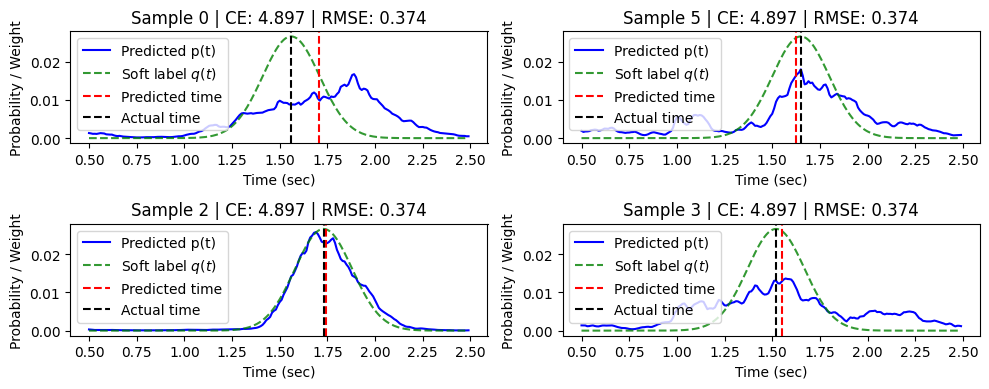

Epoch 15/200: 

Epoch 15 [31/31] Loss 4.9948 CE 4.9948 RMSE 0.3851 KL 0.0000 WASS 0.0000 NRMSE 0.9463 Entropy 4.950: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9463 Total loss: 155.1539 Total CE: 155.1539 Total RMSE: 12.0771 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7337 RMSE@τ=0.75 0.3735 NRMSE 0.9211: 100%|██████████| 91/91 [00:04<00:00, 21.62it/s]

Val (τ*) 0.750 | NRMSE: 921.130, CE: 4.896113, RMSE(s): 0.373467, bias(s): 0.015170


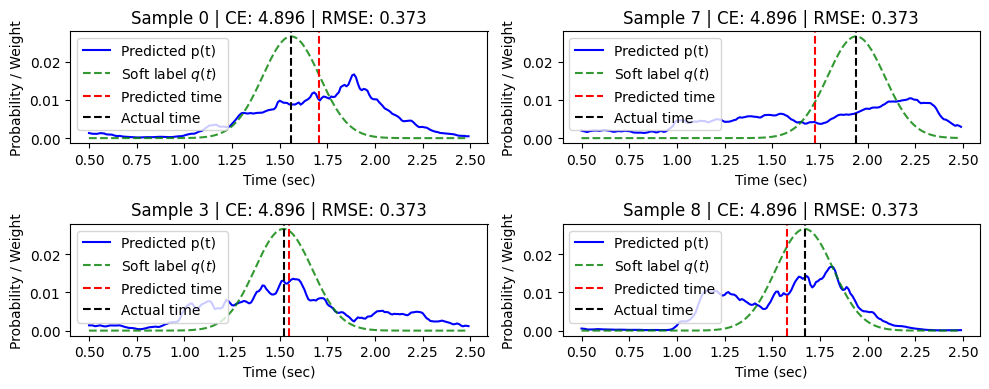

Epoch 16/200: 

Epoch 16 [31/31] Loss 5.0160 CE 5.0160 RMSE 0.3948 KL 0.0000 WASS 0.0000 NRMSE 0.9473 Entropy 5.017: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9473 Total loss: 155.2684 Total CE: 155.2684 Total RMSE: 12.0954 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7342 RMSE@τ=0.75 0.3734 NRMSE 0.9211: 100%|██████████| 91/91 [00:04<00:00, 21.82it/s]

Val (τ*) 0.750 | NRMSE: 921.058, CE: 4.895793, RMSE(s): 0.373438, bias(s): 0.014845


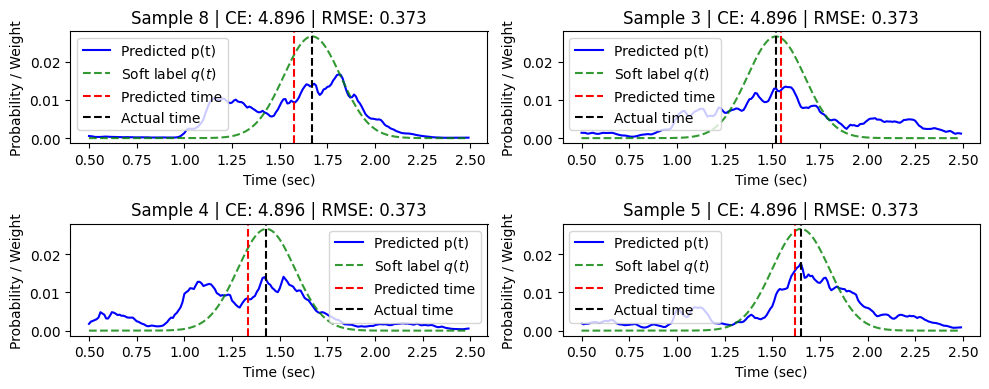

Epoch 17/200: 

Epoch 17 [31/31] Loss 4.9894 CE 4.9894 RMSE 0.3745 KL 0.0000 WASS 0.0000 NRMSE 0.9462 Entropy 4.960: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9462 Total loss: 155.2254 Total CE: 155.2254 Total RMSE: 12.0860 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7345 RMSE@τ=0.75 0.3734 NRMSE 0.9210: 100%|██████████| 91/91 [00:04<00:00, 21.50it/s]

Val (τ*) 0.750 | NRMSE: 921.009, CE: 4.895565, RMSE(s): 0.373418, bias(s): 0.014609


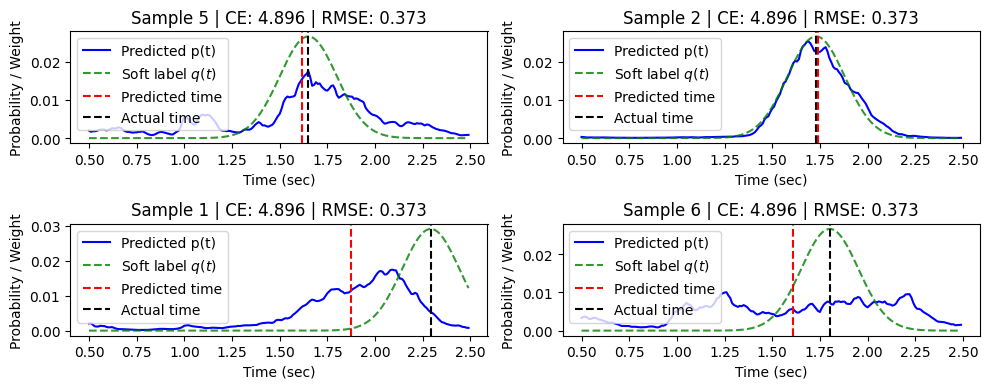

Epoch 18/200: 

Epoch 18 [31/31] Loss 4.9890 CE 4.9890 RMSE 0.3785 KL 0.0000 WASS 0.0000 NRMSE 0.9518 Entropy 4.968: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9518 Total loss: 155.4296 Total CE: 155.4296 Total RMSE: 12.1542 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7345 RMSE@τ=0.75 0.3735 NRMSE 0.9212: 100%|██████████| 91/91 [00:04<00:00, 21.36it/s]

Val (τ*) 0.750 | NRMSE: 921.159, CE: 4.895718, RMSE(s): 0.373479, bias(s): 0.014705


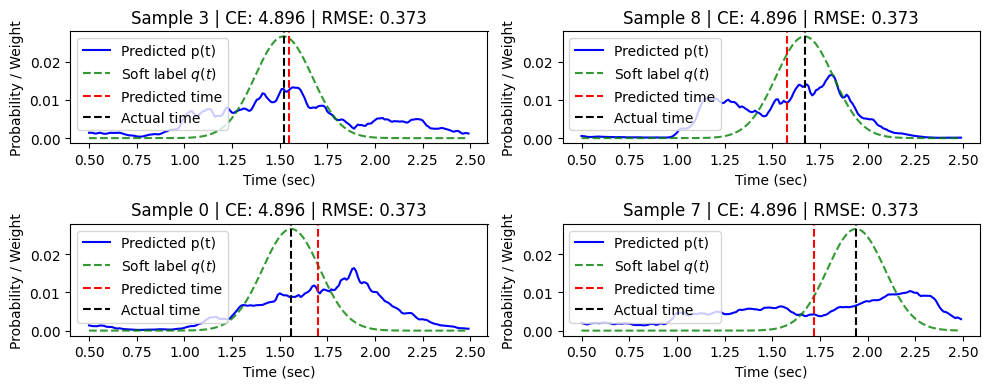

Epoch 19/200: 

Epoch 19 [31/31] Loss 5.0020 CE 5.0020 RMSE 0.3933 KL 0.0000 WASS 0.0000 NRMSE 0.9481 Entropy 4.971: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9481 Total loss: 155.2229 Total CE: 155.2229 Total RMSE: 12.1034 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7347 RMSE@τ=0.75 0.3734 NRMSE 0.9211: 100%|██████████| 91/91 [00:04<00:00, 21.39it/s]

Val (τ*) 0.750 | NRMSE: 921.083, CE: 4.895479, RMSE(s): 0.373448, bias(s): 0.014454


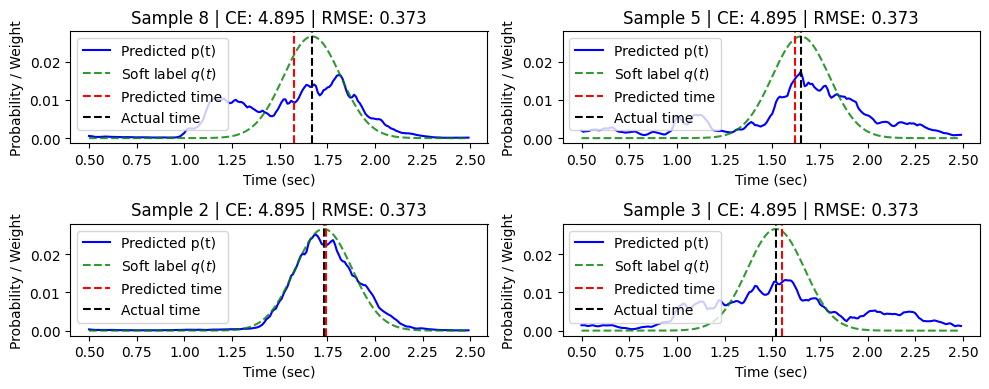

Epoch 20/200: 

Epoch 20 [31/31] Loss 5.0002 CE 5.0002 RMSE 0.3943 KL 0.0000 WASS 0.0000 NRMSE 0.9490 Entropy 4.966: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9490 Total loss: 155.2221 Total CE: 155.2221 Total RMSE: 12.1335 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7348 RMSE@τ=0.75 0.3734 NRMSE 0.9210: 100%|██████████| 91/91 [00:04<00:00, 21.69it/s]

Val (τ*) 0.750 | NRMSE: 920.994, CE: 4.895228, RMSE(s): 0.373412, bias(s): 0.014190


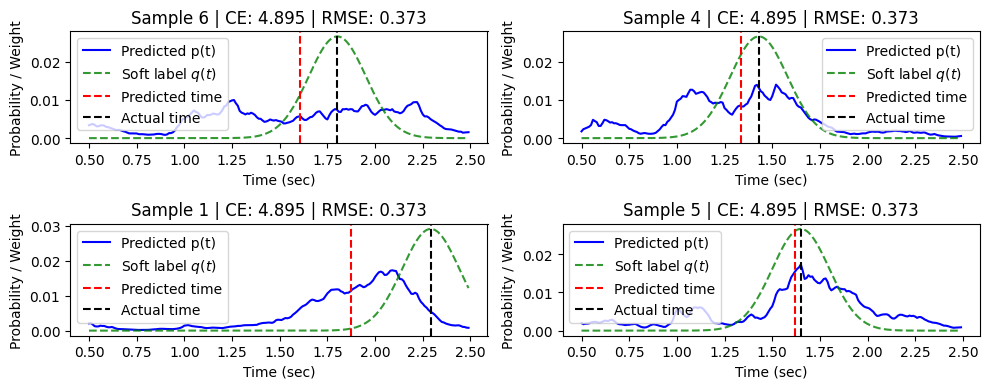

Restart from checkpoint ../artefacts/models/challenge_1/inception_v0.pth. Best Val NRMSE: 916.920839 (epoch None)
Updating learning rate 0.0001 -> 5e-05
Epoch 21/200: 

Epoch 21 [31/31] Loss 5.0260 CE 5.0260 RMSE 0.3933 KL 0.0000 WASS 0.0000 NRMSE 0.9499 Entropy 4.813: 100%|██████████| 31/31 [00:14<00:00,  2.16it/s]

NRMSE: 0.9499 Total loss: 156.3806 Total CE: 156.3806 Total RMSE: 12.1440 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7532 RMSE@τ=0.75 0.3737 NRMSE 0.9218: 100%|██████████| 91/91 [00:04<00:00, 21.59it/s]

Val (τ*) 0.750 | NRMSE: 921.812, CE: 4.943288, RMSE(s): 0.373743, bias(s): 0.017268


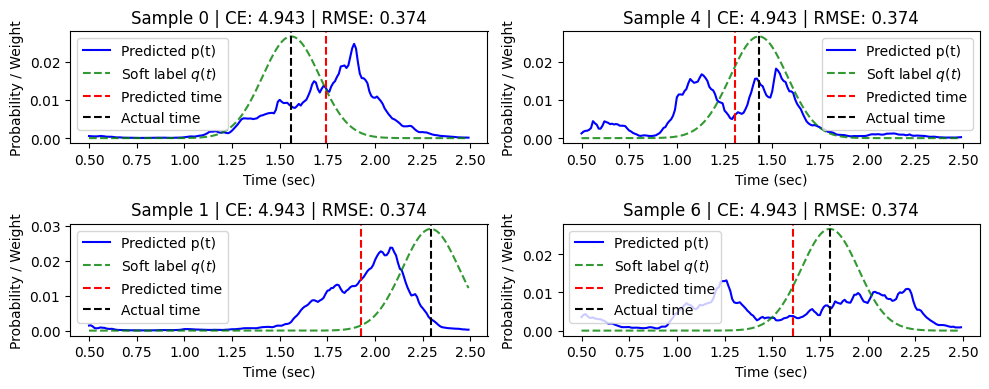

Epoch 22/200: 

Epoch 22 [31/31] Loss 5.0373 CE 5.0373 RMSE 0.4001 KL 0.0000 WASS 0.0000 NRMSE 0.9499 Entropy 4.876: 100%|██████████| 31/31 [00:14<00:00,  2.16it/s]

NRMSE: 0.9499 Total loss: 156.1449 Total CE: 156.1449 Total RMSE: 12.1119 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7383 RMSE@τ=0.75 0.3737 NRMSE 0.9216: 100%|██████████| 91/91 [00:04<00:00, 21.69it/s]

Val (τ*) 0.750 | NRMSE: 921.627, CE: 4.934030, RMSE(s): 0.373668, bias(s): 0.018243


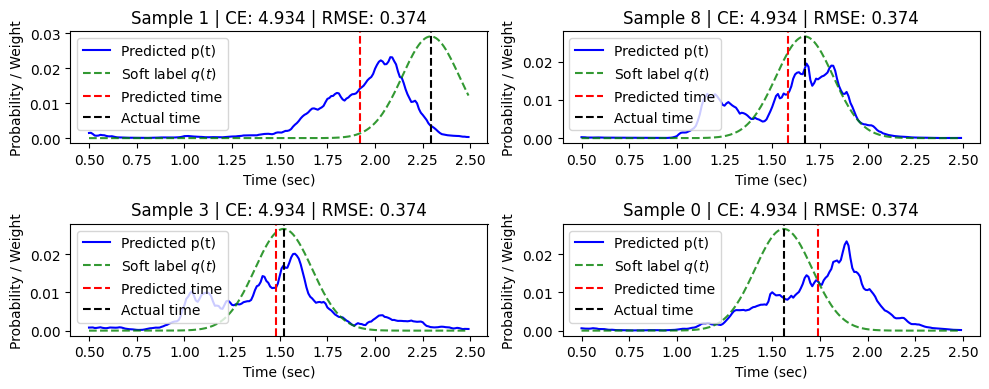

Epoch 23/200: 

Epoch 23 [31/31] Loss 5.0188 CE 5.0188 RMSE 0.3798 KL 0.0000 WASS 0.0000 NRMSE 0.9519 Entropy 4.836: 100%|██████████| 31/31 [00:14<00:00,  2.16it/s]

NRMSE: 0.9519 Total loss: 156.2910 Total CE: 156.2910 Total RMSE: 12.1474 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7289 RMSE@τ=0.75 0.3737 NRMSE 0.9217: 100%|██████████| 91/91 [00:04<00:00, 21.64it/s]

Val (τ*) 0.750 | NRMSE: 921.703, CE: 4.927143, RMSE(s): 0.373699, bias(s): 0.019108


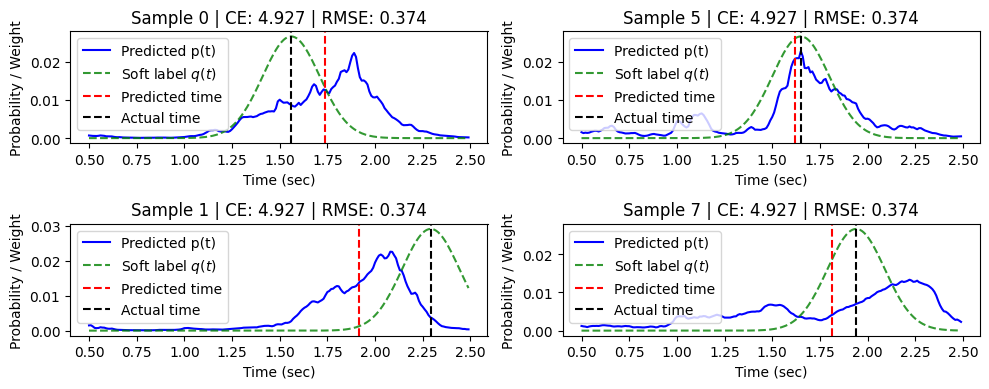

Epoch 24/200: 

Epoch 24 [31/31] Loss 5.0103 CE 5.0103 RMSE 0.3831 KL 0.0000 WASS 0.0000 NRMSE 0.9518 Entropy 4.842: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9518 Total loss: 156.0487 Total CE: 156.0487 Total RMSE: 12.1572 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7243 RMSE@τ=0.75 0.3737 NRMSE 0.9218: 100%|██████████| 91/91 [00:04<00:00, 21.61it/s]

Val (τ*) 0.750 | NRMSE: 921.799, CE: 4.922196, RMSE(s): 0.373738, bias(s): 0.019530


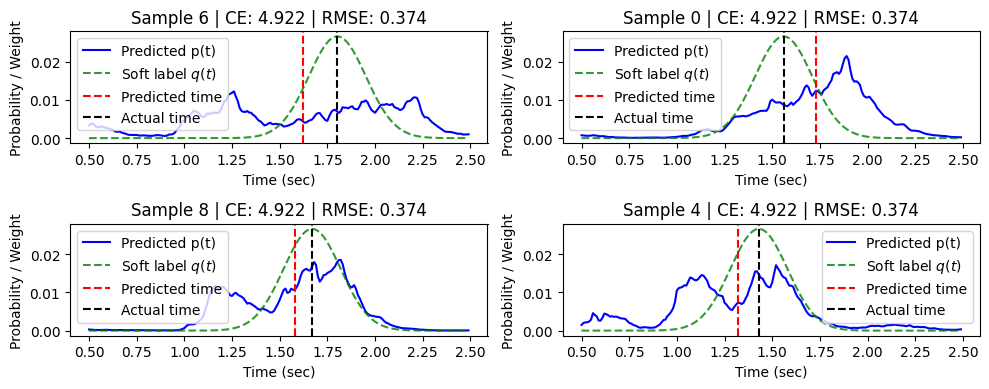

Epoch 25/200: 

Epoch 25 [31/31] Loss 5.0220 CE 5.0220 RMSE 0.3962 KL 0.0000 WASS 0.0000 NRMSE 0.9510 Entropy 4.855: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9510 Total loss: 155.9575 Total CE: 155.9575 Total RMSE: 12.1317 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7220 RMSE@τ=0.75 0.3738 NRMSE 0.9219: 100%|██████████| 91/91 [00:04<00:00, 21.36it/s]

Val (τ*) 0.750 | NRMSE: 921.859, CE: 4.918377, RMSE(s): 0.373763, bias(s): 0.019670


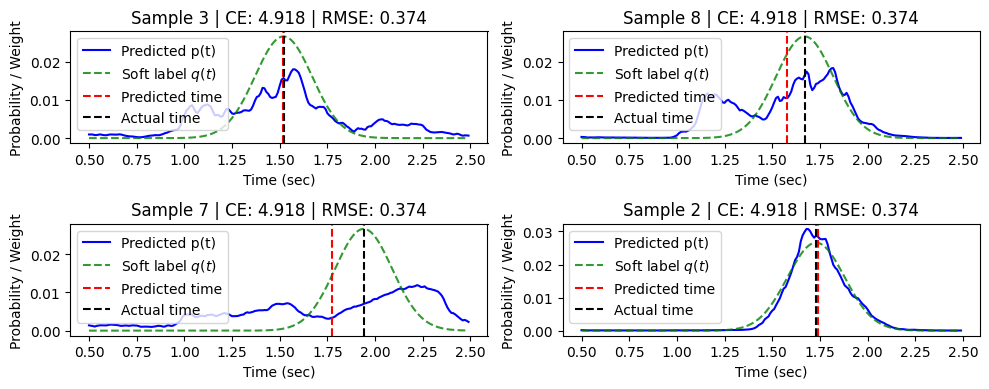

Epoch 26/200: 

Epoch 26 [31/31] Loss 5.0418 CE 5.0418 RMSE 0.3864 KL 0.0000 WASS 0.0000 NRMSE 0.9529 Entropy 4.912: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9529 Total loss: 156.0009 Total CE: 156.0009 Total RMSE: 12.1659 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7207 RMSE@τ=0.75 0.3738 NRMSE 0.9220: 100%|██████████| 91/91 [00:04<00:00, 21.66it/s]

Val (τ*) 0.750 | NRMSE: 922.001, CE: 4.915297, RMSE(s): 0.373820, bias(s): 0.019887


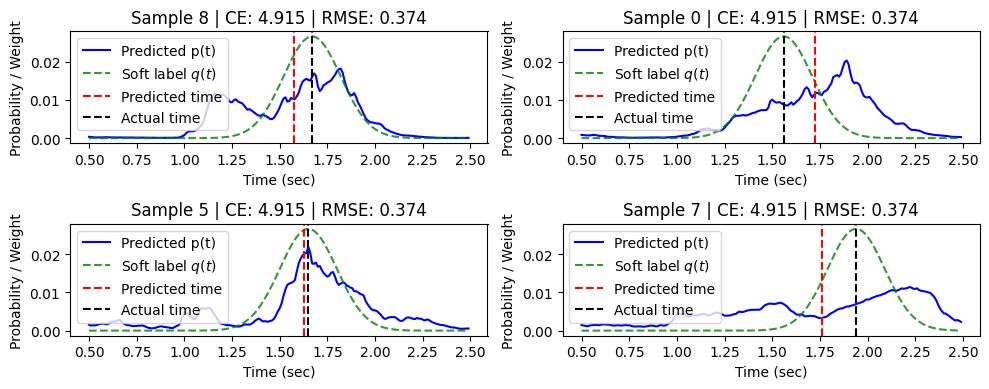

Epoch 27/200: 

Epoch 27 [31/31] Loss 5.0384 CE 5.0384 RMSE 0.3927 KL 0.0000 WASS 0.0000 NRMSE 0.9476 Entropy 4.928: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9476 Total loss: 155.7448 Total CE: 155.7448 Total RMSE: 12.1119 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7211 RMSE@τ=0.75 0.3738 NRMSE 0.9219: 100%|██████████| 91/91 [00:04<00:00, 21.47it/s]

Val (τ*) 0.750 | NRMSE: 921.902, CE: 4.912732, RMSE(s): 0.373780, bias(s): 0.019589


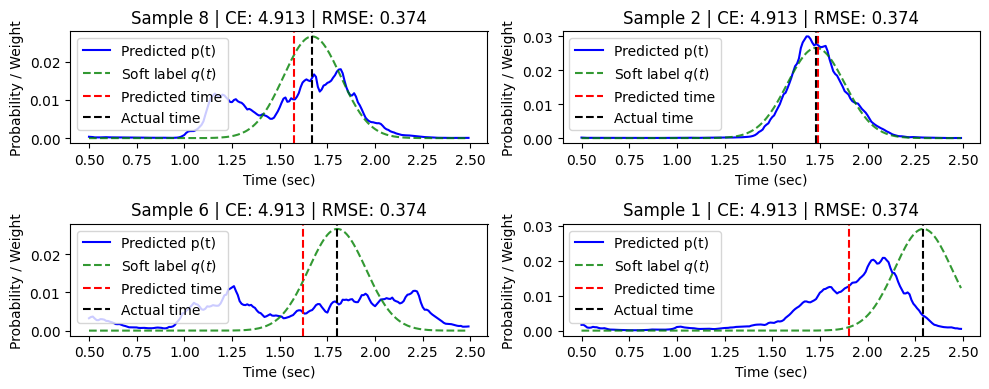

Epoch 28/200: 

Epoch 28 [31/31] Loss 5.0183 CE 5.0183 RMSE 0.3920 KL 0.0000 WASS 0.0000 NRMSE 0.9497 Entropy 4.866: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9497 Total loss: 155.6866 Total CE: 155.6866 Total RMSE: 12.1268 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7214 RMSE@τ=0.75 0.3738 NRMSE 0.9218: 100%|██████████| 91/91 [00:04<00:00, 21.42it/s]

Val (τ*) 0.750 | NRMSE: 921.845, CE: 4.910568, RMSE(s): 0.373757, bias(s): 0.019348


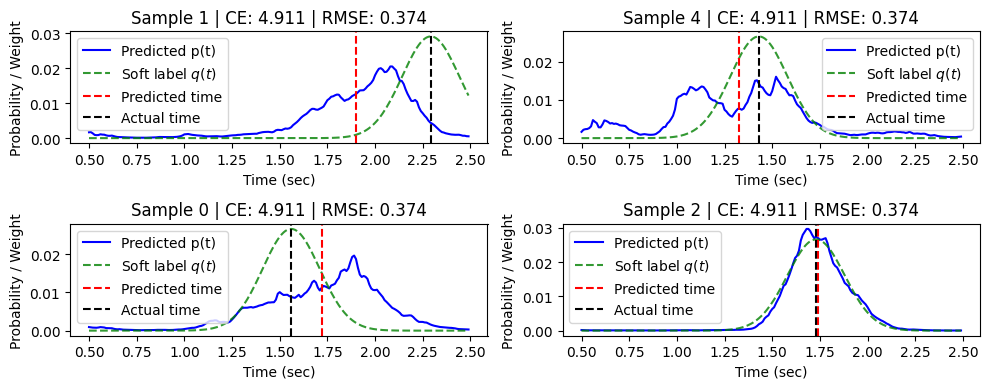

Epoch 29/200: 

Epoch 29 [31/31] Loss 5.0387 CE 5.0387 RMSE 0.3965 KL 0.0000 WASS 0.0000 NRMSE 0.9512 Entropy 4.939: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9512 Total loss: 155.7787 Total CE: 155.7787 Total RMSE: 12.1502 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7218 RMSE@τ=0.75 0.3738 NRMSE 0.9219: 100%|██████████| 91/91 [00:04<00:00, 21.53it/s]

Val (τ*) 0.750 | NRMSE: 921.863, CE: 4.908692, RMSE(s): 0.373764, bias(s): 0.019245


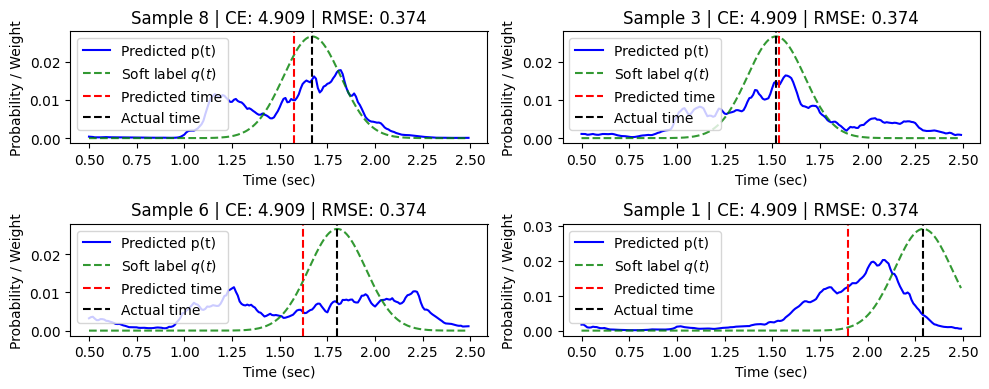

Epoch 30/200: 

Epoch 30 [31/31] Loss 5.0168 CE 5.0168 RMSE 0.3796 KL 0.0000 WASS 0.0000 NRMSE 0.9487 Entropy 4.947: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9487 Total loss: 155.6244 Total CE: 155.6244 Total RMSE: 12.1118 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7225 RMSE@τ=0.75 0.3737 NRMSE 0.9218: 100%|██████████| 91/91 [00:04<00:00, 21.19it/s]

Val (τ*) 0.750 | NRMSE: 921.818, CE: 4.907080, RMSE(s): 0.373746, bias(s): 0.019031


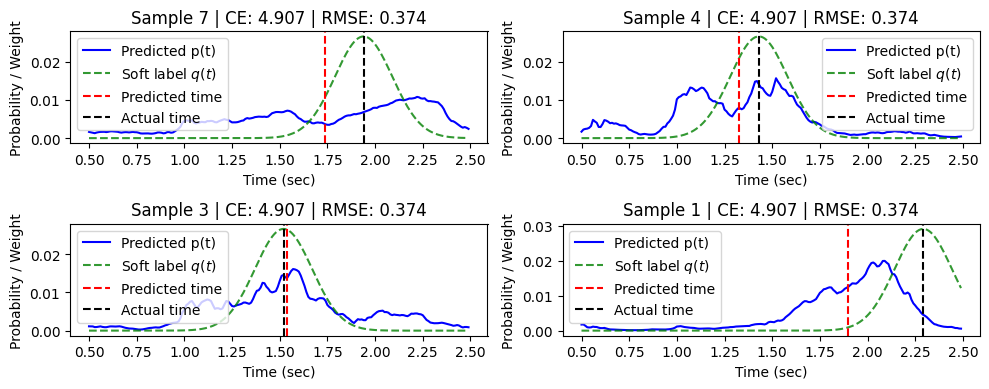

Epoch 31/200: 

Epoch 31 [31/31] Loss 4.9996 CE 4.9996 RMSE 0.3903 KL 0.0000 WASS 0.0000 NRMSE 0.9511 Entropy 4.946: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

NRMSE: 0.9511 Total loss: 155.6361 Total CE: 155.6361 Total RMSE: 12.1418 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7231 RMSE@τ=0.75 0.3737 NRMSE 0.9218: 100%|██████████| 91/91 [00:04<00:00, 21.37it/s]

Val (τ*) 0.750 | NRMSE: 921.769, CE: 4.905657, RMSE(s): 0.373726, bias(s): 0.018785


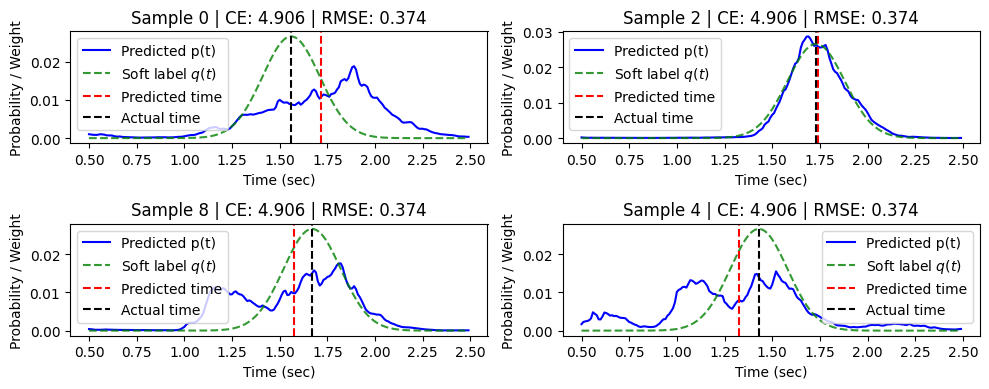

Epoch 32/200: 

Epoch 32 [31/31] Loss 5.0364 CE 5.0364 RMSE 0.4071 KL 0.0000 WASS 0.0000 NRMSE 0.9475 Entropy 4.952: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9475 Total loss: 155.5476 Total CE: 155.5476 Total RMSE: 12.1055 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7238 RMSE@τ=0.75 0.3737 NRMSE 0.9217: 100%|██████████| 91/91 [00:04<00:00, 21.35it/s]

Val (τ*) 0.750 | NRMSE: 921.734, CE: 4.904443, RMSE(s): 0.373712, bias(s): 0.018566


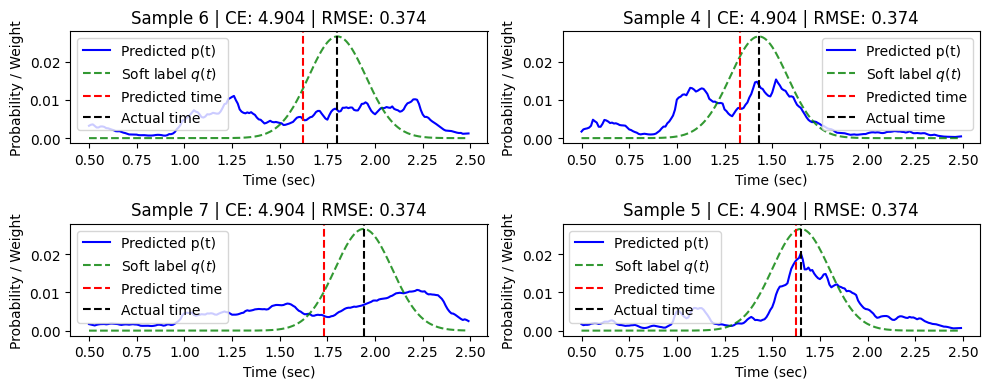

Epoch 33/200: 

Epoch 33 [31/31] Loss 5.0148 CE 5.0148 RMSE 0.3908 KL 0.0000 WASS 0.0000 NRMSE 0.9484 Entropy 4.956: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9484 Total loss: 155.4719 Total CE: 155.4719 Total RMSE: 12.1158 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7249 RMSE@τ=0.75 0.3736 NRMSE 0.9216: 100%|██████████| 91/91 [00:04<00:00, 21.50it/s]

Val (τ*) 0.750 | NRMSE: 921.553, CE: 4.903211, RMSE(s): 0.373638, bias(s): 0.018108


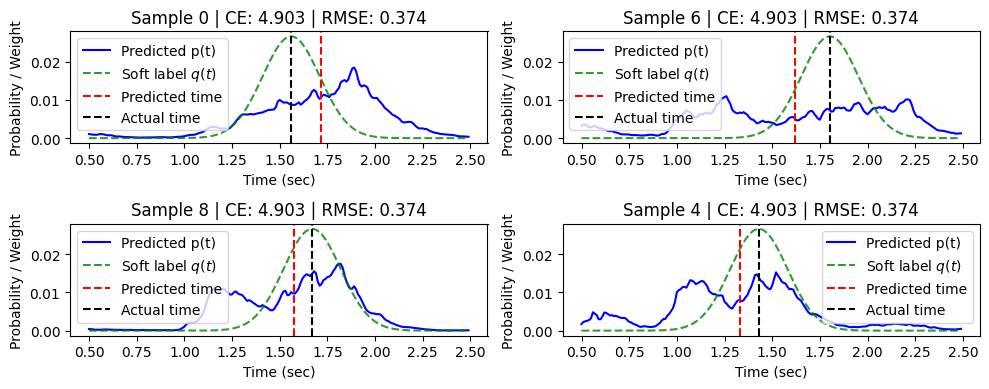

Epoch 34/200: 

Epoch 34 [31/31] Loss 5.0206 CE 5.0206 RMSE 0.3851 KL 0.0000 WASS 0.0000 NRMSE 0.9490 Entropy 4.965: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9490 Total loss: 155.5139 Total CE: 155.5139 Total RMSE: 12.1175 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7257 RMSE@τ=0.75 0.3736 NRMSE 0.9215: 100%|██████████| 91/91 [00:04<00:00, 21.64it/s]

Val (τ*) 0.750 | NRMSE: 921.532, CE: 4.902267, RMSE(s): 0.373630, bias(s): 0.017919


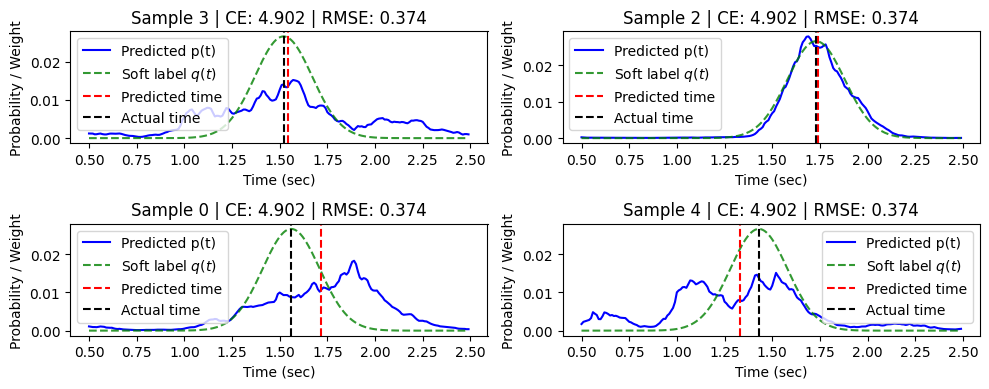

Epoch 35/200: 

Epoch 35 [31/31] Loss 5.0238 CE 5.0238 RMSE 0.3900 KL 0.0000 WASS 0.0000 NRMSE 0.9510 Entropy 4.962: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9510 Total loss: 155.5108 Total CE: 155.5108 Total RMSE: 12.1424 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7263 RMSE@τ=0.75 0.3737 NRMSE 0.9216: 100%|██████████| 91/91 [00:04<00:00, 21.52it/s]

Val (τ*) 0.750 | NRMSE: 921.614, CE: 4.901594, RMSE(s): 0.373663, bias(s): 0.017890


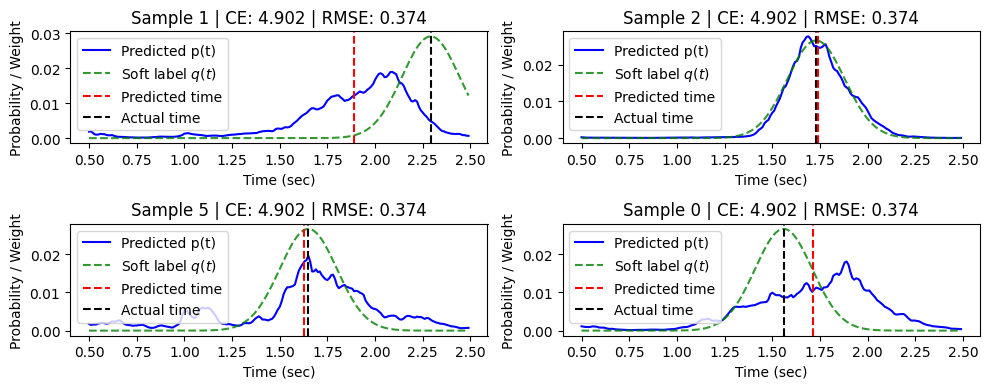

Epoch 36/200: 

Epoch 36 [31/31] Loss 5.0323 CE 5.0323 RMSE 0.4032 KL 0.0000 WASS 0.0000 NRMSE 0.9509 Entropy 4.969: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9509 Total loss: 155.5891 Total CE: 155.5891 Total RMSE: 12.1392 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7268 RMSE@τ=0.75 0.3737 NRMSE 0.9217: 100%|██████████| 91/91 [00:04<00:00, 21.23it/s]

Val (τ*) 0.750 | NRMSE: 921.668, CE: 4.900982, RMSE(s): 0.373685, bias(s): 0.017806


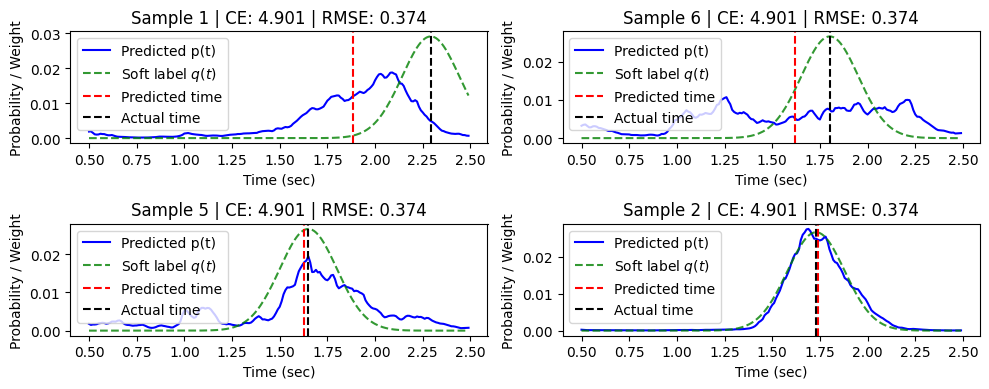

Epoch 37/200: 

Epoch 37 [31/31] Loss 5.0101 CE 5.0101 RMSE 0.3877 KL 0.0000 WASS 0.0000 NRMSE 0.9478 Entropy 4.928: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9478 Total loss: 155.3266 Total CE: 155.3266 Total RMSE: 12.1017 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7276 RMSE@τ=0.75 0.3736 NRMSE 0.9215: 100%|██████████| 91/91 [00:04<00:00, 21.38it/s]

Val (τ*) 0.750 | NRMSE: 921.494, CE: 4.900169, RMSE(s): 0.373615, bias(s): 0.017379


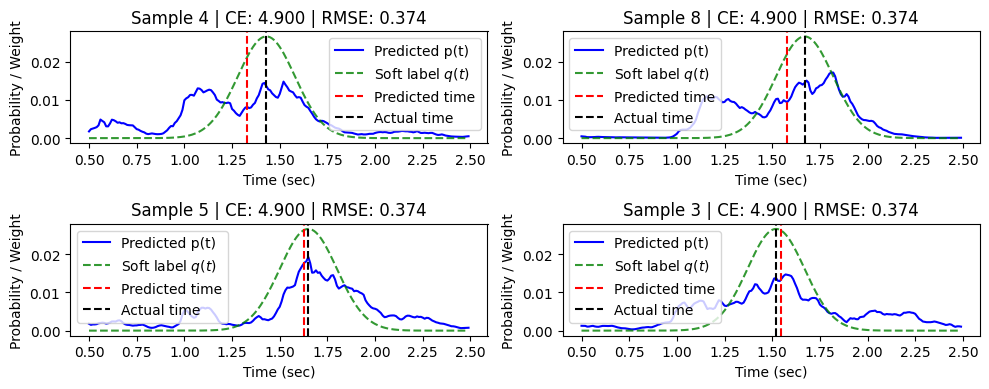

Epoch 38/200: 

Epoch 38 [31/31] Loss 5.0013 CE 5.0013 RMSE 0.3784 KL 0.0000 WASS 0.0000 NRMSE 0.9472 Entropy 4.926: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9472 Total loss: 155.3291 Total CE: 155.3291 Total RMSE: 12.1071 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7285 RMSE@τ=0.75 0.3736 NRMSE 0.9214: 100%|██████████| 91/91 [00:04<00:00, 21.44it/s]

Val (τ*) 0.750 | NRMSE: 921.364, CE: 4.899461, RMSE(s): 0.373562, bias(s): 0.017024


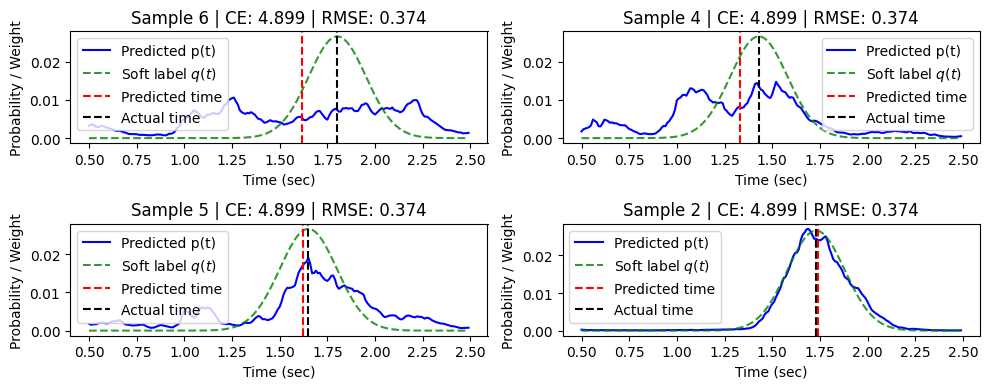

Epoch 39/200: 

Epoch 39 [31/31] Loss 5.0056 CE 5.0056 RMSE 0.3846 KL 0.0000 WASS 0.0000 NRMSE 0.9482 Entropy 4.925: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9482 Total loss: 155.3165 Total CE: 155.3165 Total RMSE: 12.0907 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7291 RMSE@τ=0.75 0.3735 NRMSE 0.9213: 100%|██████████| 91/91 [00:04<00:00, 21.50it/s]

Val (τ*) 0.750 | NRMSE: 921.318, CE: 4.898960, RMSE(s): 0.373543, bias(s): 0.016814


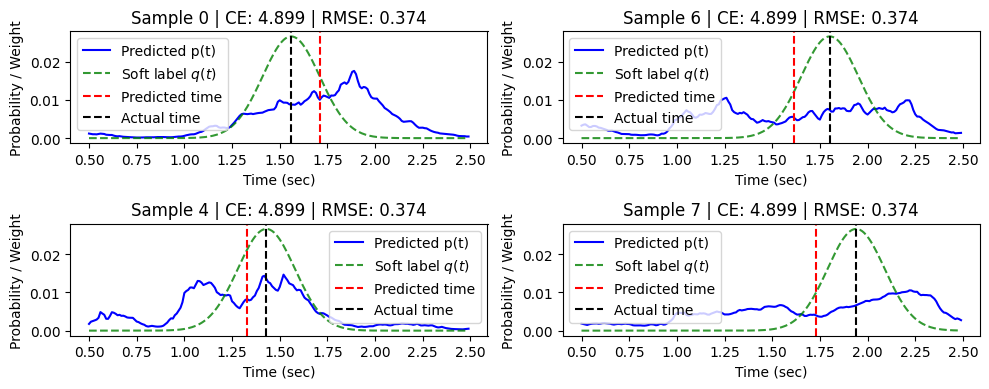

Epoch 40/200: 

Epoch 40 [31/31] Loss 4.9927 CE 4.9927 RMSE 0.3753 KL 0.0000 WASS 0.0000 NRMSE 0.9510 Entropy 4.989: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9510 Total loss: 155.5269 Total CE: 155.5269 Total RMSE: 12.1391 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7296 RMSE@τ=0.75 0.3736 NRMSE 0.9215: 100%|██████████| 91/91 [00:04<00:00, 21.25it/s]

Val (τ*) 0.750 | NRMSE: 921.459, CE: 4.898758, RMSE(s): 0.373600, bias(s): 0.016876


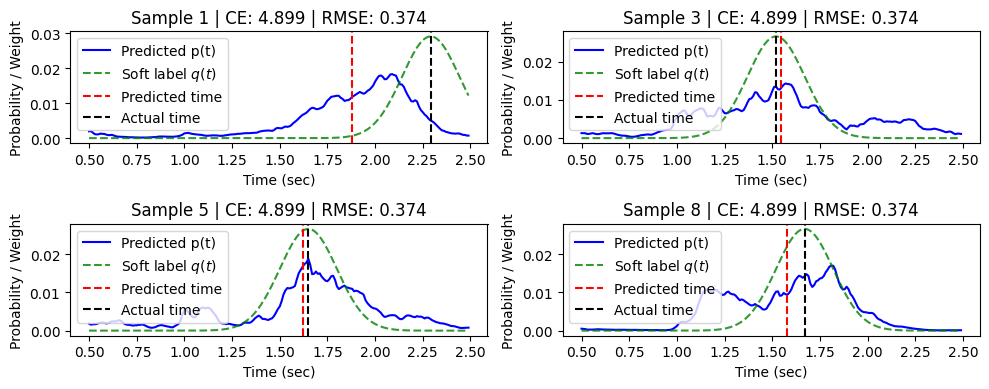

Restart from checkpoint ../artefacts/models/challenge_1/inception_v0.pth. Best Val NRMSE: 916.920839 (epoch None)
Updating learning rate 5e-05 -> 2.5e-05
Epoch 41/200: 

Epoch 41 [31/31] Loss 5.0280 CE 5.0280 RMSE 0.3835 KL 0.0000 WASS 0.0000 NRMSE 0.9524 Entropy 4.867: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9524 Total loss: 156.3959 Total CE: 156.3959 Total RMSE: 12.1488 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7514 RMSE@τ=0.75 0.3738 NRMSE 0.9220: 100%|██████████| 91/91 [00:04<00:00, 21.40it/s]

Val (τ*) 0.750 | NRMSE: 922.016, CE: 4.945454, RMSE(s): 0.373826, bias(s): 0.017838


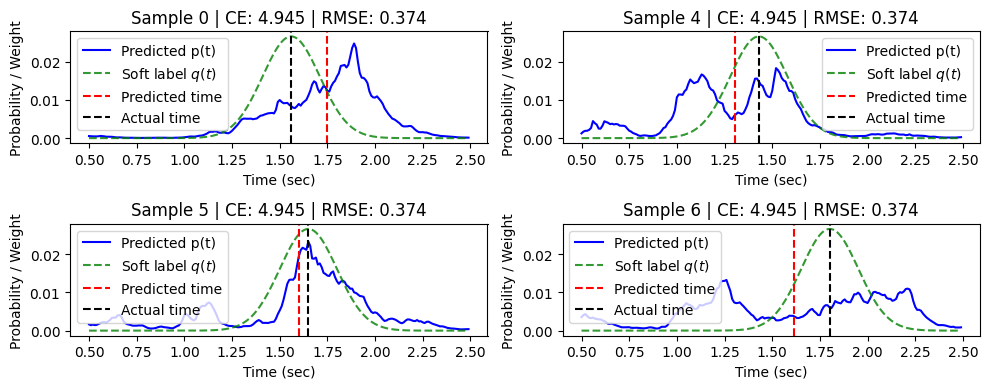

Epoch 42/200: 

Epoch 42 [31/31] Loss 5.0418 CE 5.0418 RMSE 0.3899 KL 0.0000 WASS 0.0000 NRMSE 0.9491 Entropy 4.806: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9491 Total loss: 156.2295 Total CE: 156.2295 Total RMSE: 12.1087 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7381 RMSE@τ=0.75 0.3738 NRMSE 0.9220: 100%|██████████| 91/91 [00:04<00:00, 21.56it/s]


Val (τ*) 0.750 | NRMSE: 922.024, CE: 4.938893, RMSE(s): 0.373829, bias(s): 0.018892


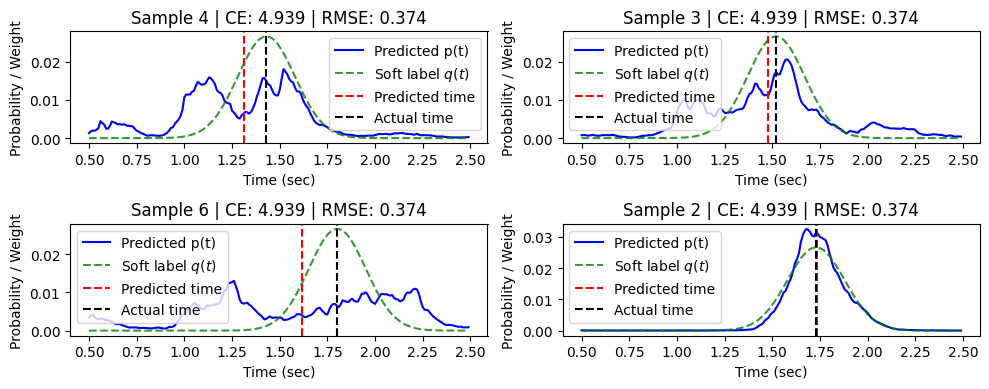

Epoch 43/200: 

Epoch 43 [31/31] Loss 5.0486 CE 5.0486 RMSE 0.4010 KL 0.0000 WASS 0.0000 NRMSE 0.9534 Entropy 4.817: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9534 Total loss: 156.4229 Total CE: 156.4229 Total RMSE: 12.1760 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7290 RMSE@τ=0.75 0.3739 NRMSE 0.9222: 100%|██████████| 91/91 [00:04<00:00, 21.78it/s]

Val (τ*) 0.750 | NRMSE: 922.223, CE: 4.933784, RMSE(s): 0.373910, bias(s): 0.019890


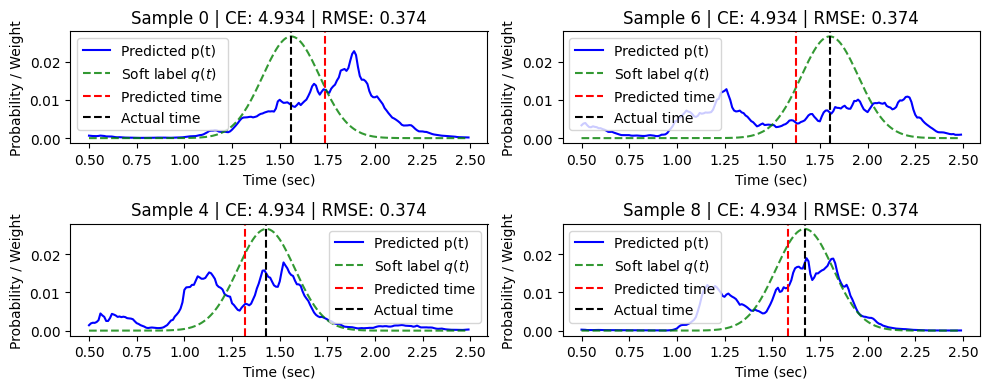

Epoch 44/200: 

Epoch 44 [31/31] Loss 5.0059 CE 5.0059 RMSE 0.3697 KL 0.0000 WASS 0.0000 NRMSE 0.9480 Entropy 4.819: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9480 Total loss: 156.1217 Total CE: 156.1217 Total RMSE: 12.1029 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7255 RMSE@τ=0.75 0.3739 NRMSE 0.9223: 100%|██████████| 91/91 [00:04<00:00, 21.39it/s]

Val (τ*) 0.750 | NRMSE: 922.296, CE: 4.930490, RMSE(s): 0.373940, bias(s): 0.020128


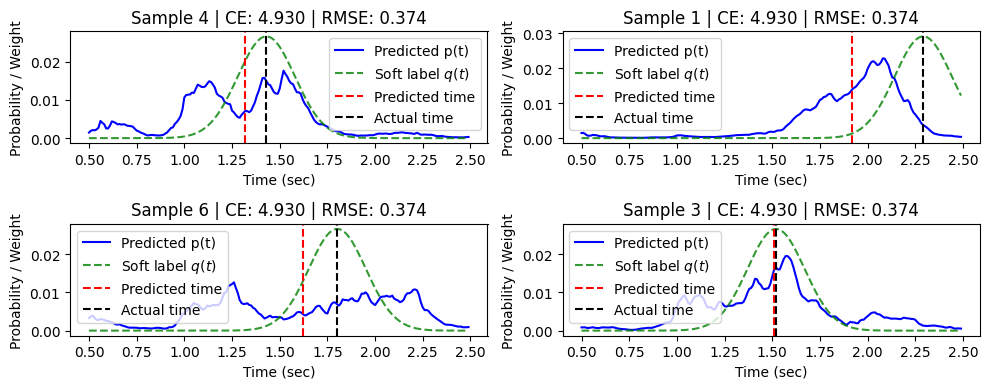

Epoch 45/200: 

Epoch 45 [31/31] Loss 5.0079 CE 5.0079 RMSE 0.3789 KL 0.0000 WASS 0.0000 NRMSE 0.9509 Entropy 4.822: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9509 Total loss: 156.1891 Total CE: 156.1891 Total RMSE: 12.1400 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7225 RMSE@τ=0.75 0.3740 NRMSE 0.9224: 100%|██████████| 91/91 [00:04<00:00, 21.34it/s]

Val (τ*) 0.750 | NRMSE: 922.448, CE: 4.927596, RMSE(s): 0.374001, bias(s): 0.020487


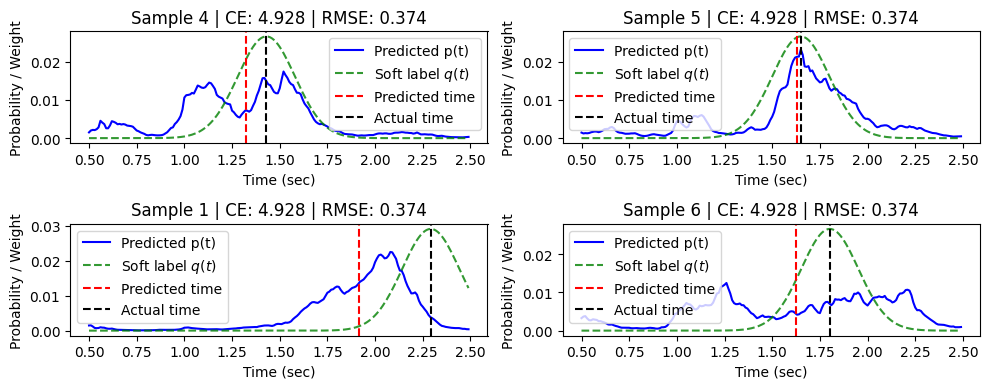

Epoch 46/200: 

Epoch 46 [31/31] Loss 5.0480 CE 5.0480 RMSE 0.4041 KL 0.0000 WASS 0.0000 NRMSE 0.9498 Entropy 4.884: 100%|██████████| 31/31 [00:14<00:00,  2.16it/s]

NRMSE: 0.9498 Total loss: 156.0047 Total CE: 156.0047 Total RMSE: 12.1075 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7214 RMSE@τ=0.75 0.3740 NRMSE 0.9225: 100%|██████████| 91/91 [00:04<00:00, 21.13it/s]

Val (τ*) 0.750 | NRMSE: 922.462, CE: 4.925310, RMSE(s): 0.374007, bias(s): 0.020498


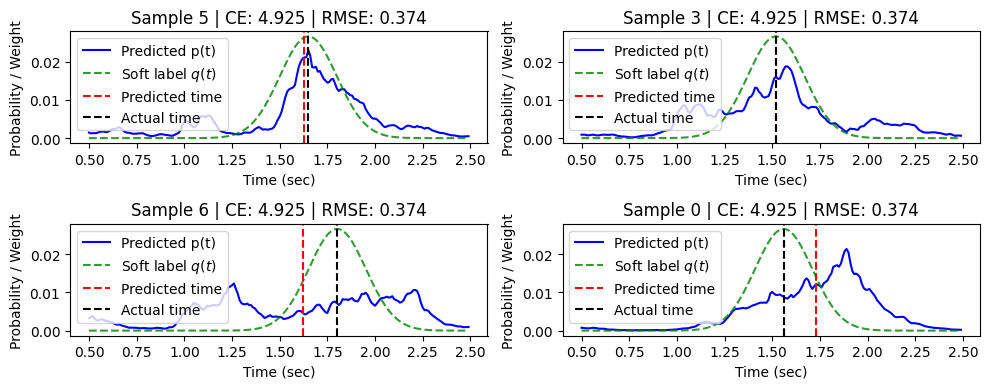

Epoch 47/200: 

Epoch 47 [31/31] Loss 5.0367 CE 5.0367 RMSE 0.3923 KL 0.0000 WASS 0.0000 NRMSE 0.9511 Entropy 4.897: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9511 Total loss: 156.0467 Total CE: 156.0467 Total RMSE: 12.1369 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7201 RMSE@τ=0.75 0.3740 NRMSE 0.9225: 100%|██████████| 91/91 [00:04<00:00, 21.65it/s]

Val (τ*) 0.750 | NRMSE: 922.546, CE: 4.923211, RMSE(s): 0.374041, bias(s): 0.020636


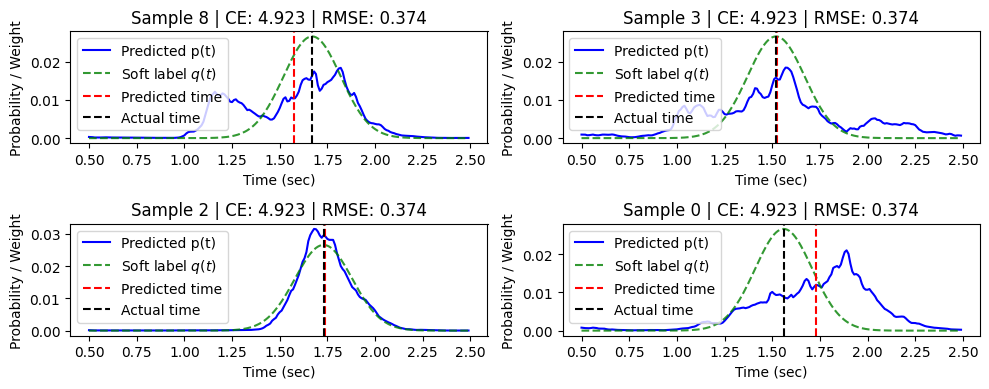

Epoch 48/200: 

Epoch 48 [31/31] Loss 5.0246 CE 5.0246 RMSE 0.3981 KL 0.0000 WASS 0.0000 NRMSE 0.9500 Entropy 4.846: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9500 Total loss: 156.0145 Total CE: 156.0145 Total RMSE: 12.1236 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7199 RMSE@τ=0.75 0.3740 NRMSE 0.9225: 100%|██████████| 91/91 [00:04<00:00, 21.24it/s]

Val (τ*) 0.750 | NRMSE: 922.532, CE: 4.921350, RMSE(s): 0.374035, bias(s): 0.020583


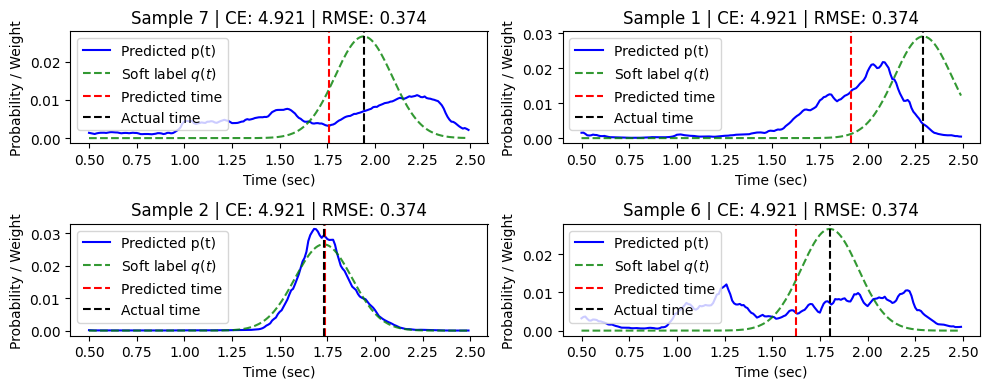

Epoch 49/200: 

Epoch 49 [31/31] Loss 5.0529 CE 5.0529 RMSE 0.3940 KL 0.0000 WASS 0.0000 NRMSE 0.9478 Entropy 4.858: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9478 Total loss: 155.8894 Total CE: 155.8894 Total RMSE: 12.0988 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7202 RMSE@τ=0.75 0.3740 NRMSE 0.9224: 100%|██████████| 91/91 [00:04<00:00, 21.36it/s]

Val (τ*) 0.750 | NRMSE: 922.411, CE: 4.919645, RMSE(s): 0.373986, bias(s): 0.020345


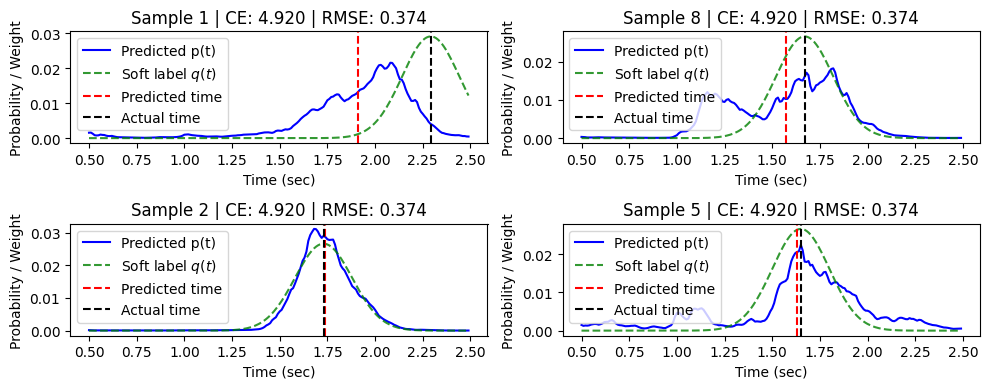

Epoch 50/200: 

Epoch 50 [31/31] Loss 5.0300 CE 5.0300 RMSE 0.3855 KL 0.0000 WASS 0.0000 NRMSE 0.9501 Entropy 4.919: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9501 Total loss: 155.9361 Total CE: 155.9361 Total RMSE: 12.1343 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7199 RMSE@τ=0.75 0.3740 NRMSE 0.9225: 100%|██████████| 91/91 [00:04<00:00, 21.57it/s]

Val (τ*) 0.750 | NRMSE: 922.453, CE: 4.918081, RMSE(s): 0.374003, bias(s): 0.020390


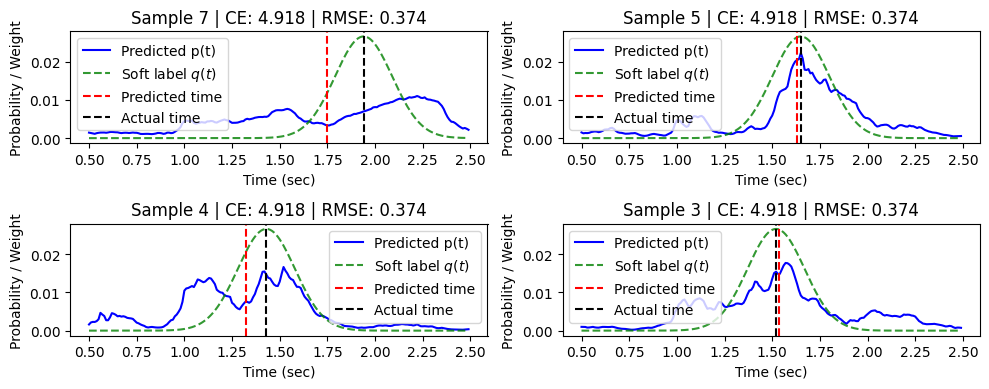

Epoch 51/200: 

Epoch 51 [31/31] Loss 5.0296 CE 5.0296 RMSE 0.3919 KL 0.0000 WASS 0.0000 NRMSE 0.9497 Entropy 4.916: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9497 Total loss: 155.8872 Total CE: 155.8872 Total RMSE: 12.1242 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7198 RMSE@τ=0.75 0.3740 NRMSE 0.9224: 100%|██████████| 91/91 [00:04<00:00, 21.39it/s]

Val (τ*) 0.750 | NRMSE: 922.432, CE: 4.916605, RMSE(s): 0.373995, bias(s): 0.020324


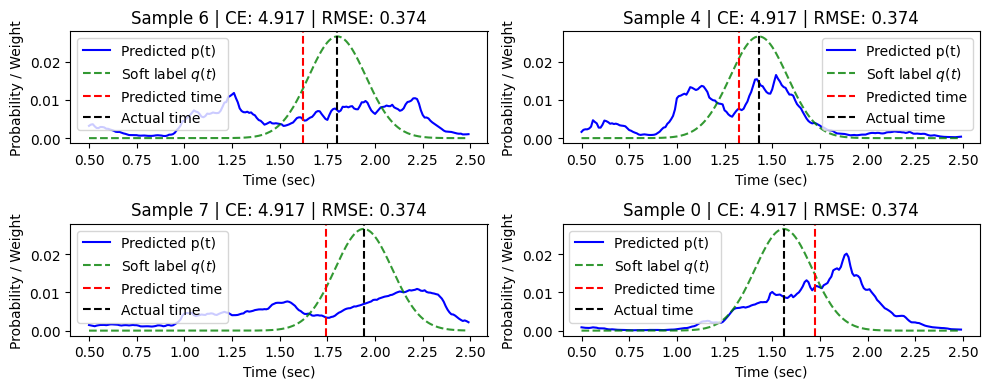

Epoch 52/200: 

Epoch 52 [31/31] Loss 5.0364 CE 5.0364 RMSE 0.3945 KL 0.0000 WASS 0.0000 NRMSE 0.9511 Entropy 4.861: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9511 Total loss: 155.8938 Total CE: 155.8938 Total RMSE: 12.1410 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7200 RMSE@τ=0.75 0.3740 NRMSE 0.9224: 100%|██████████| 91/91 [00:04<00:00, 21.48it/s]

Val (τ*) 0.750 | NRMSE: 922.367, CE: 4.915254, RMSE(s): 0.373969, bias(s): 0.020193


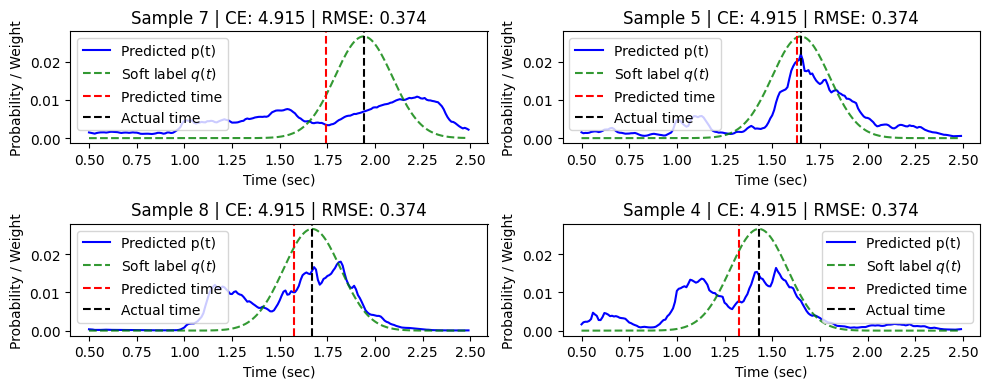

Epoch 53/200: 

Epoch 53 [31/31] Loss 5.0291 CE 5.0291 RMSE 0.4014 KL 0.0000 WASS 0.0000 NRMSE 0.9522 Entropy 4.860: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9522 Total loss: 155.9881 Total CE: 155.9881 Total RMSE: 12.1573 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7198 RMSE@τ=0.75 0.3740 NRMSE 0.9224: 100%|██████████| 91/91 [00:04<00:00, 21.41it/s]

Val (τ*) 0.750 | NRMSE: 922.412, CE: 4.913998, RMSE(s): 0.373987, bias(s): 0.020240


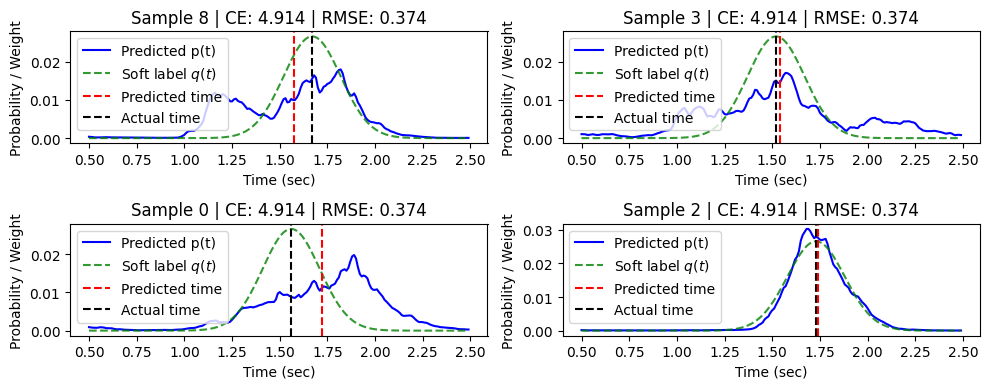

Epoch 54/200: 

Epoch 54 [31/31] Loss 5.0205 CE 5.0205 RMSE 0.3896 KL 0.0000 WASS 0.0000 NRMSE 0.9501 Entropy 4.874: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9501 Total loss: 155.7142 Total CE: 155.7142 Total RMSE: 12.1179 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7205 RMSE@τ=0.75 0.3739 NRMSE 0.9222: 100%|██████████| 91/91 [00:04<00:00, 21.17it/s]

Val (τ*) 0.750 | NRMSE: 922.246, CE: 4.912808, RMSE(s): 0.373920, bias(s): 0.019913


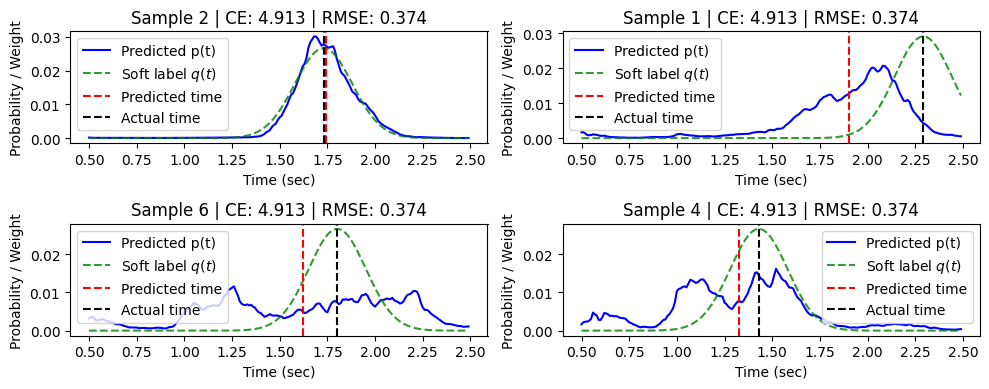

Epoch 55/200: 

Epoch 55 [31/31] Loss 5.0420 CE 5.0420 RMSE 0.3948 KL 0.0000 WASS 0.0000 NRMSE 0.9486 Entropy 4.932: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9486 Total loss: 155.7226 Total CE: 155.7226 Total RMSE: 12.1103 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7205 RMSE@τ=0.75 0.3739 NRMSE 0.9223: 100%|██████████| 91/91 [00:04<00:00, 21.41it/s]

Val (τ*) 0.750 | NRMSE: 922.266, CE: 4.911775, RMSE(s): 0.373927, bias(s): 0.019895


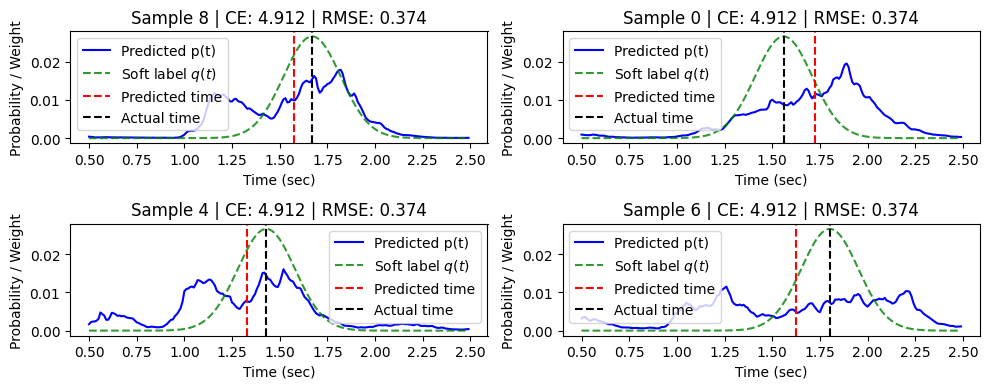

Epoch 56/200: 

Epoch 56 [31/31] Loss 5.0020 CE 5.0020 RMSE 0.3808 KL 0.0000 WASS 0.0000 NRMSE 0.9488 Entropy 4.926: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9488 Total loss: 155.7401 Total CE: 155.7401 Total RMSE: 12.1180 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7210 RMSE@τ=0.75 0.3739 NRMSE 0.9221: 100%|██████████| 91/91 [00:04<00:00, 21.47it/s]

Val (τ*) 0.750 | NRMSE: 922.142, CE: 4.910715, RMSE(s): 0.373877, bias(s): 0.019630


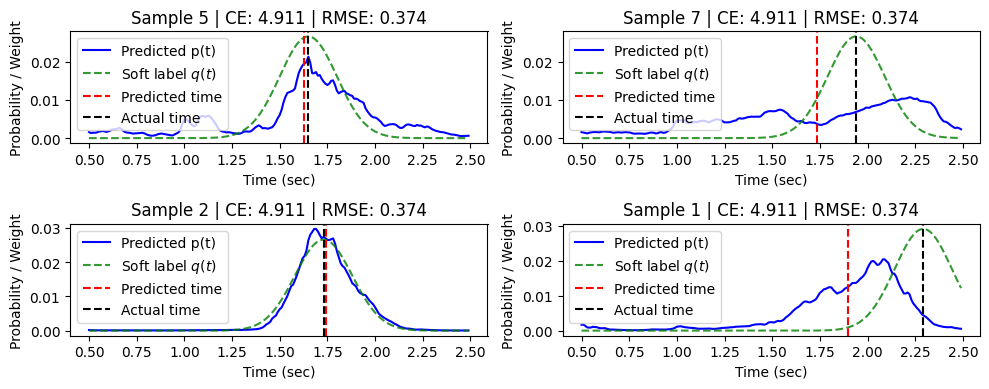

Epoch 57/200: 

Epoch 57 [31/31] Loss 5.0234 CE 5.0234 RMSE 0.4002 KL 0.0000 WASS 0.0000 NRMSE 0.9493 Entropy 4.926: 100%|██████████| 31/31 [00:14<00:00,  2.16it/s]

NRMSE: 0.9493 Total loss: 155.7390 Total CE: 155.7390 Total RMSE: 12.1230 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7214 RMSE@τ=0.75 0.3739 NRMSE 0.9221: 100%|██████████| 91/91 [00:04<00:00, 21.58it/s]

Val (τ*) 0.750 | NRMSE: 922.096, CE: 4.909751, RMSE(s): 0.373859, bias(s): 0.019517


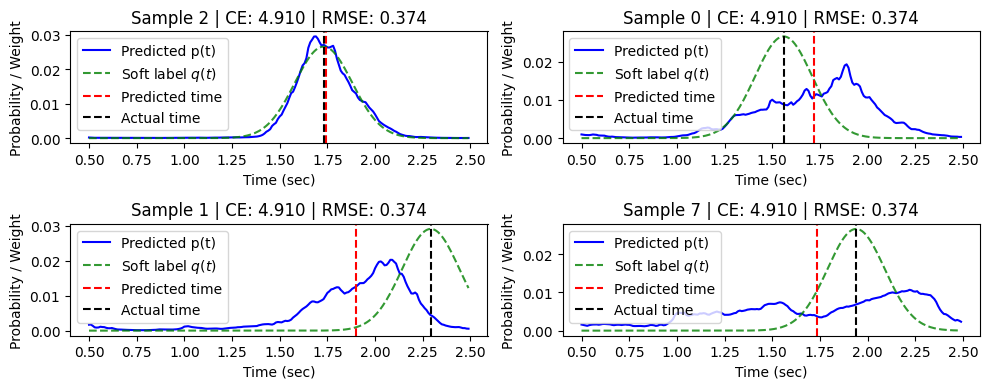

Epoch 58/200: 

Epoch 58 [31/31] Loss 5.0097 CE 5.0097 RMSE 0.3832 KL 0.0000 WASS 0.0000 NRMSE 0.9480 Entropy 4.875: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

NRMSE: 0.9480 Total loss: 155.6150 Total CE: 155.6150 Total RMSE: 12.0932 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7219 RMSE@τ=0.75 0.3738 NRMSE 0.9221: 100%|██████████| 91/91 [00:04<00:00, 21.65it/s]

Val (τ*) 0.750 | NRMSE: 922.063, CE: 4.908879, RMSE(s): 0.373845, bias(s): 0.019424


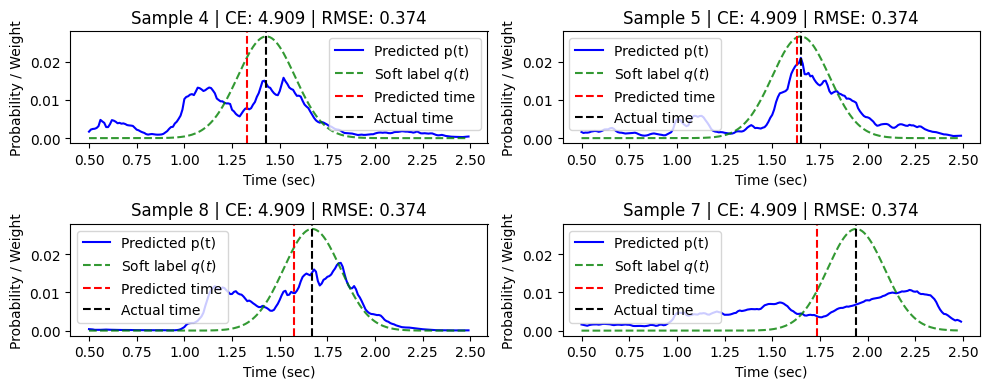

Epoch 59/200: 

Epoch 59 [31/31] Loss 5.0391 CE 5.0391 RMSE 0.3976 KL 0.0000 WASS 0.0000 NRMSE 0.9505 Entropy 4.951: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9505 Total loss: 155.7254 Total CE: 155.7254 Total RMSE: 12.1366 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7221 RMSE@τ=0.75 0.3738 NRMSE 0.9221: 100%|██████████| 91/91 [00:04<00:00, 21.58it/s]

Val (τ*) 0.750 | NRMSE: 922.051, CE: 4.908026, RMSE(s): 0.373840, bias(s): 0.019339


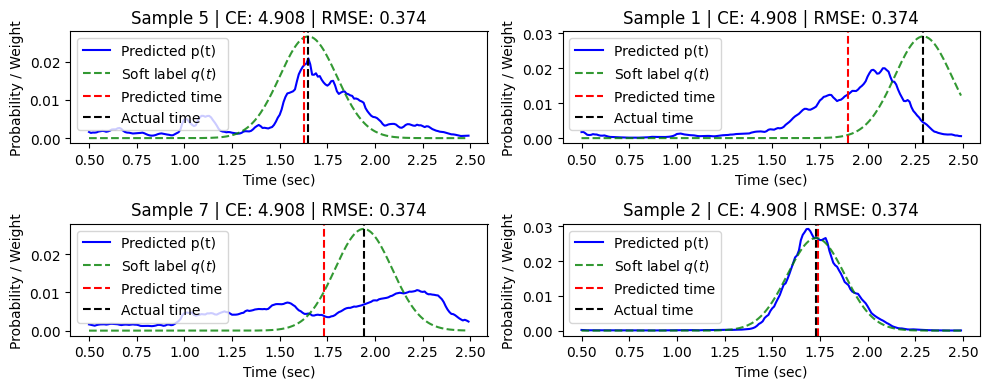

Epoch 60/200: 

Epoch 60 [31/31] Loss 5.0271 CE 5.0271 RMSE 0.3933 KL 0.0000 WASS 0.0000 NRMSE 0.9520 Entropy 4.935: 100%|██████████| 31/31 [00:17<00:00,  1.79it/s]

NRMSE: 0.9520 Total loss: 155.6627 Total CE: 155.6627 Total RMSE: 12.1585 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7222 RMSE@τ=0.75 0.3739 NRMSE 0.9221: 100%|██████████| 91/91 [00:04<00:00, 21.48it/s]

Val (τ*) 0.750 | NRMSE: 922.104, CE: 4.907324, RMSE(s): 0.373862, bias(s): 0.019361


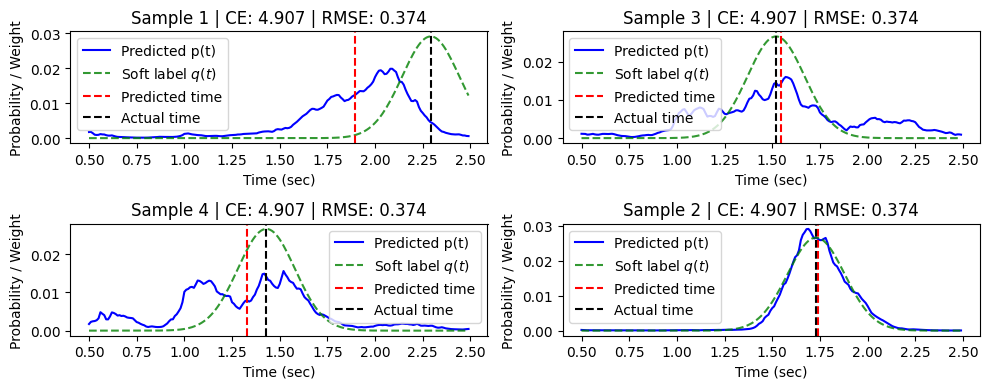

Restart from checkpoint ../artefacts/models/challenge_1/inception_v0.pth. Best Val NRMSE: 916.920839 (epoch None)
Updating learning rate 2.5e-05 -> 1.25e-05
Epoch 61/200: 

Epoch 61 [31/31] Loss 5.0617 CE 5.0617 RMSE 0.4007 KL 0.0000 WASS 0.0000 NRMSE 0.9511 Entropy 4.860: 100%|██████████| 31/31 [00:18<00:00,  1.72it/s]

NRMSE: 0.9511 Total loss: 156.4124 Total CE: 156.4124 Total RMSE: 12.1358 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7538 RMSE@τ=0.75 0.3739 NRMSE 0.9221: 100%|██████████| 91/91 [00:04<00:00, 21.44it/s]

Val (τ*) 0.750 | NRMSE: 922.080, CE: 4.947435, RMSE(s): 0.373852, bias(s): 0.017638


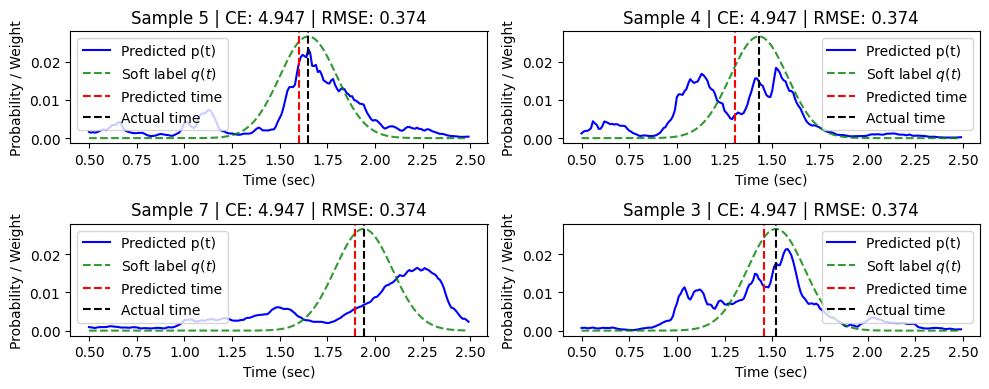

Epoch 62/200: 

Epoch 62 [31/31] Loss 5.0518 CE 5.0518 RMSE 0.3870 KL 0.0000 WASS 0.0000 NRMSE 0.9515 Entropy 4.811: 100%|██████████| 31/31 [00:18<00:00,  1.71it/s]

NRMSE: 0.9515 Total loss: 156.3812 Total CE: 156.3812 Total RMSE: 12.1415 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7382 RMSE@τ=0.75 0.3739 NRMSE 0.9222: 100%|██████████| 91/91 [00:04<00:00, 21.56it/s]

Val (τ*) 0.750 | NRMSE: 922.209, CE: 4.941480, RMSE(s): 0.373904, bias(s): 0.019109


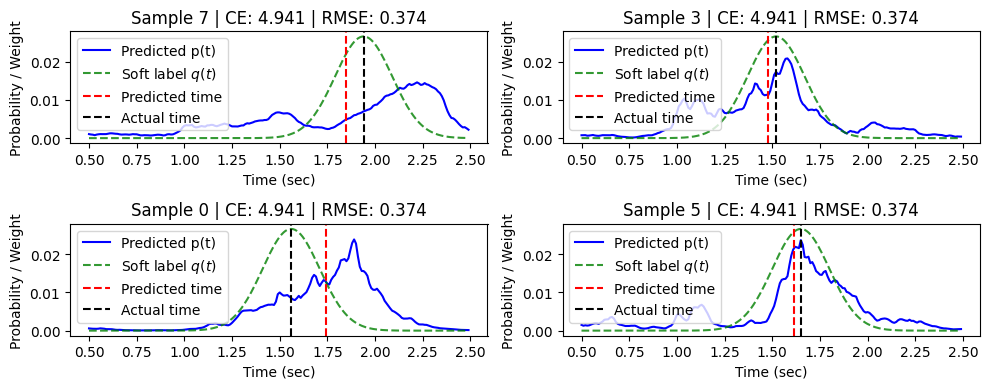

Epoch 63/200: 

Epoch 63 [31/31] Loss 5.0409 CE 5.0409 RMSE 0.3841 KL 0.0000 WASS 0.0000 NRMSE 0.9508 Entropy 4.869: 100%|██████████| 31/31 [00:18<00:00,  1.69it/s]


NRMSE: 0.9508 Total loss: 156.3415 Total CE: 156.3415 Total RMSE: 12.1389 Total KL: 0.0000 Total WASS: 0.0000


Val [91/91] CE 4.7302 RMSE@τ=0.75 0.3740 NRMSE 0.9224: 100%|██████████| 91/91 [00:04<00:00, 21.03it/s]

Val (τ*) 0.750 | NRMSE: 922.430, CE: 4.937834, RMSE(s): 0.373994, bias(s): 0.019963


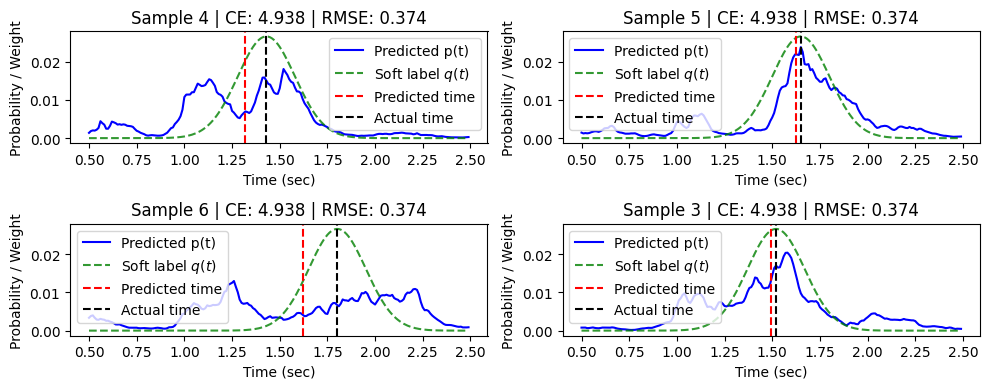

Epoch 64/200: 

Epoch 64 [31/31] Loss 5.0816 CE 5.0816 RMSE 0.4064 KL 0.0000 WASS 0.0000 NRMSE 0.9529 Entropy 4.874: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

NRMSE: 0.9529 Total loss: 156.4072 Total CE: 156.4072 Total RMSE: 12.1714 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7251 RMSE@τ=0.75 0.3741 NRMSE 0.9227: 100%|██████████| 91/91 [00:04<00:00, 21.21it/s]

Val (τ*) 0.750 | NRMSE: 922.704, CE: 4.935009, RMSE(s): 0.374105, bias(s): 0.020707


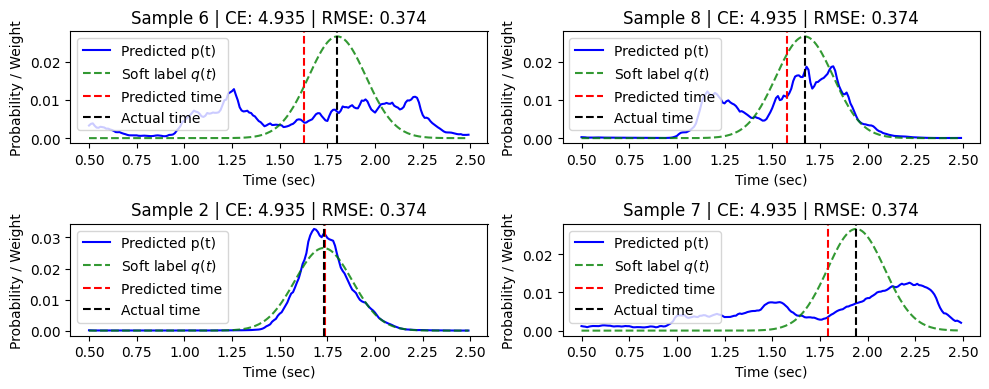

Epoch 65/200: 

Epoch 65 [31/31] Loss 5.0617 CE 5.0617 RMSE 0.4059 KL 0.0000 WASS 0.0000 NRMSE 0.9514 Entropy 4.879: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9514 Total loss: 156.2014 Total CE: 156.2014 Total RMSE: 12.1395 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7232 RMSE@τ=0.75 0.3741 NRMSE 0.9228: 100%|██████████| 91/91 [00:04<00:00, 21.26it/s]

Val (τ*) 0.750 | NRMSE: 922.807, CE: 4.933257, RMSE(s): 0.374147, bias(s): 0.020873


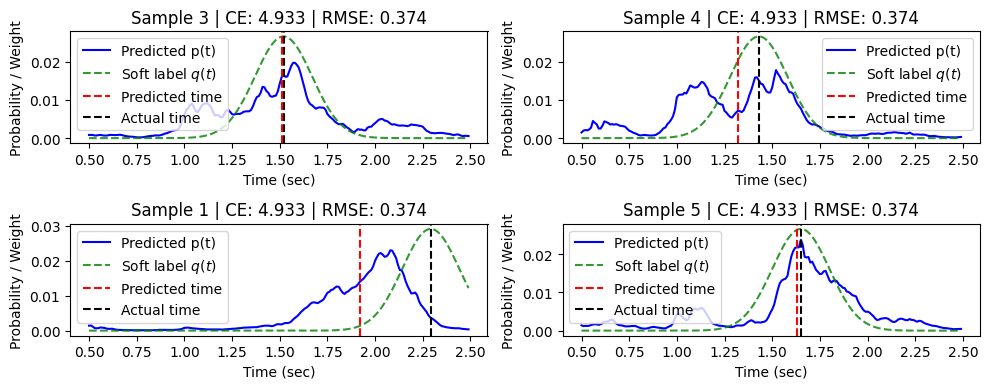

Epoch 66/200: 

Epoch 66 [31/31] Loss 5.0445 CE 5.0445 RMSE 0.3875 KL 0.0000 WASS 0.0000 NRMSE 0.9517 Entropy 4.822: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9517 Total loss: 156.3072 Total CE: 156.3072 Total RMSE: 12.1637 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7212 RMSE@τ=0.75 0.3742 NRMSE 0.9230: 100%|██████████| 91/91 [00:04<00:00, 21.23it/s]

Val (τ*) 0.750 | NRMSE: 922.951, CE: 4.931611, RMSE(s): 0.374205, bias(s): 0.021136


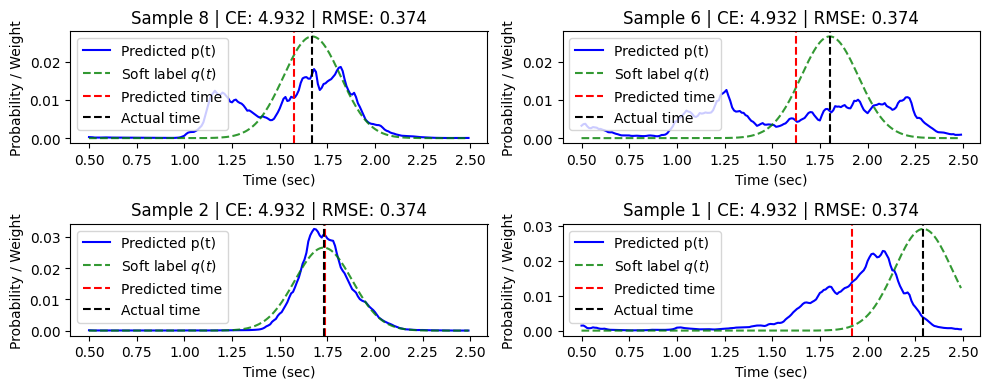

Epoch 67/200: 

Epoch 67 [31/31] Loss 5.0375 CE 5.0375 RMSE 0.3853 KL 0.0000 WASS 0.0000 NRMSE 0.9504 Entropy 4.832: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9504 Total loss: 156.2276 Total CE: 156.2276 Total RMSE: 12.1380 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7209 RMSE@τ=0.75 0.3742 NRMSE 0.9230: 100%|██████████| 91/91 [00:04<00:00, 21.15it/s]

Val (τ*) 0.750 | NRMSE: 922.959, CE: 4.930316, RMSE(s): 0.374208, bias(s): 0.021110


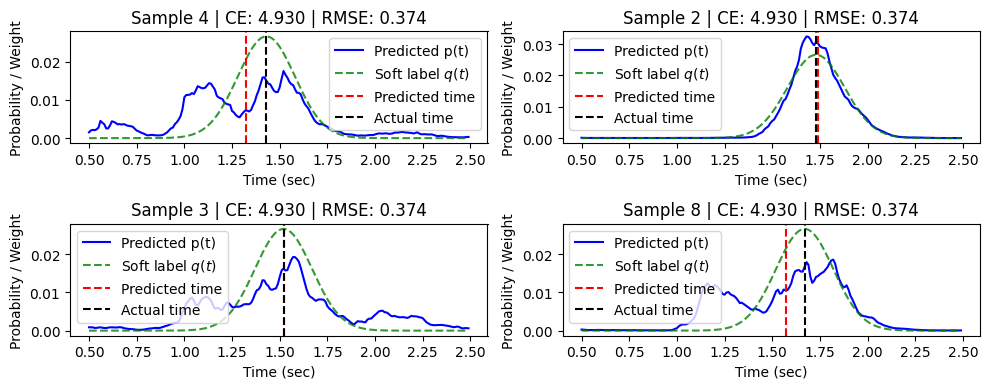

Epoch 68/200: 

Epoch 68 [31/31] Loss 5.0377 CE 5.0377 RMSE 0.3918 KL 0.0000 WASS 0.0000 NRMSE 0.9506 Entropy 4.889: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9506 Total loss: 156.2086 Total CE: 156.2086 Total RMSE: 12.1346 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7199 RMSE@τ=0.75 0.3743 NRMSE 0.9231: 100%|██████████| 91/91 [00:04<00:00, 20.73it/s]

Val (τ*) 0.750 | NRMSE: 923.076, CE: 4.928976, RMSE(s): 0.374256, bias(s): 0.021340


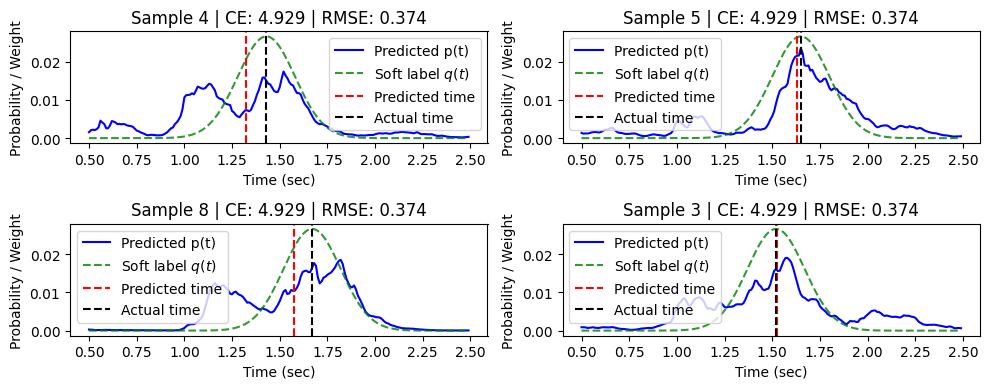

Epoch 69/200: 

Epoch 69 [31/31] Loss 5.0211 CE 5.0211 RMSE 0.3865 KL 0.0000 WASS 0.0000 NRMSE 0.9507 Entropy 4.814: 100%|██████████| 31/31 [00:24<00:00,  1.27it/s]

NRMSE: 0.9507 Total loss: 156.1230 Total CE: 156.1230 Total RMSE: 12.1321 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7198 RMSE@τ=0.75 0.3742 NRMSE 0.9230: 100%|██████████| 91/91 [00:04<00:00, 21.23it/s]

Val (τ*) 0.750 | NRMSE: 923.016, CE: 4.927887, RMSE(s): 0.374232, bias(s): 0.021213


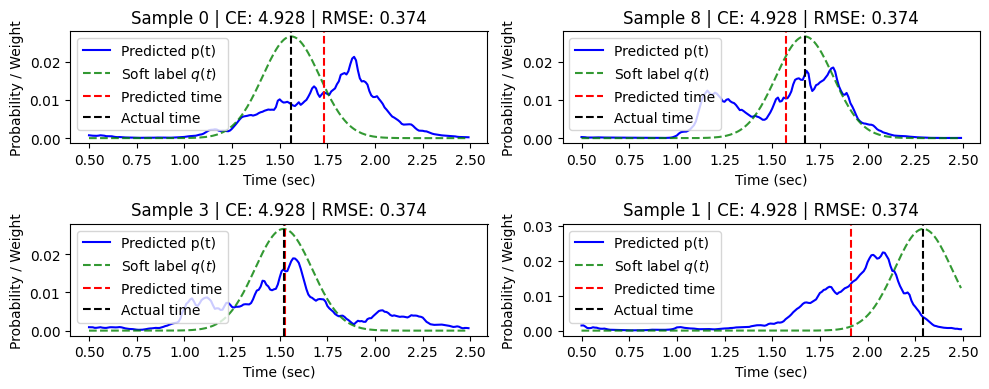

Epoch 70/200: 

Epoch 70 [31/31] Loss 5.0200 CE 5.0200 RMSE 0.3734 KL 0.0000 WASS 0.0000 NRMSE 0.9506 Entropy 4.827: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9506 Total loss: 156.1030 Total CE: 156.1030 Total RMSE: 12.1311 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7196 RMSE@τ=0.75 0.3742 NRMSE 0.9230: 100%|██████████| 91/91 [00:04<00:00, 21.33it/s]

Val (τ*) 0.750 | NRMSE: 922.983, CE: 4.926771, RMSE(s): 0.374218, bias(s): 0.021157


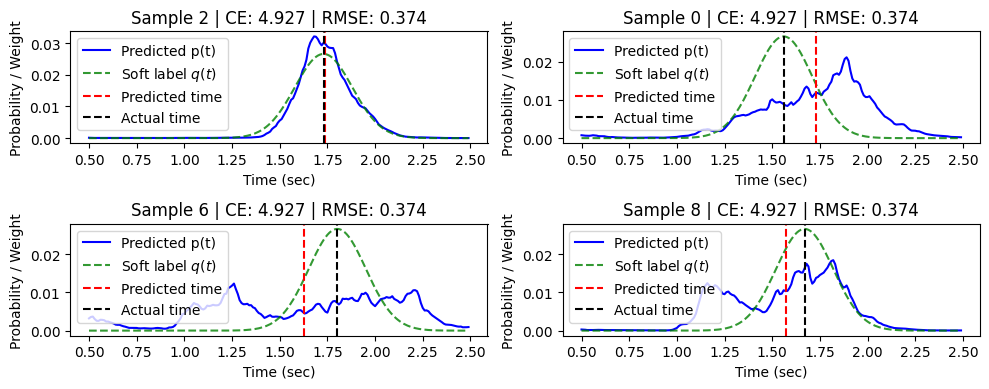

Epoch 71/200: 

Epoch 71 [31/31] Loss 5.0172 CE 5.0172 RMSE 0.3857 KL 0.0000 WASS 0.0000 NRMSE 0.9498 Entropy 4.834: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

NRMSE: 0.9498 Total loss: 156.0763 Total CE: 156.0763 Total RMSE: 12.1246 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7199 RMSE@τ=0.75 0.3742 NRMSE 0.9229: 100%|██████████| 91/91 [00:04<00:00, 21.10it/s]

Val (τ*) 0.750 | NRMSE: 922.881, CE: 4.925794, RMSE(s): 0.374177, bias(s): 0.020950


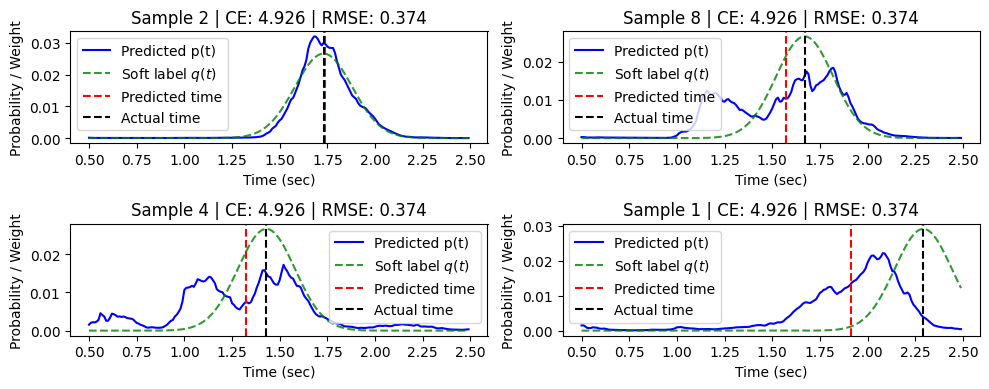

Epoch 72/200: 

Epoch 72 [31/31] Loss 5.0242 CE 5.0242 RMSE 0.3839 KL 0.0000 WASS 0.0000 NRMSE 0.9502 Entropy 4.833: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9502 Total loss: 156.1299 Total CE: 156.1299 Total RMSE: 12.1356 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7196 RMSE@τ=0.75 0.3742 NRMSE 0.9229: 100%|██████████| 91/91 [00:04<00:00, 21.03it/s]

Val (τ*) 0.750 | NRMSE: 922.880, CE: 4.924795, RMSE(s): 0.374177, bias(s): 0.020946


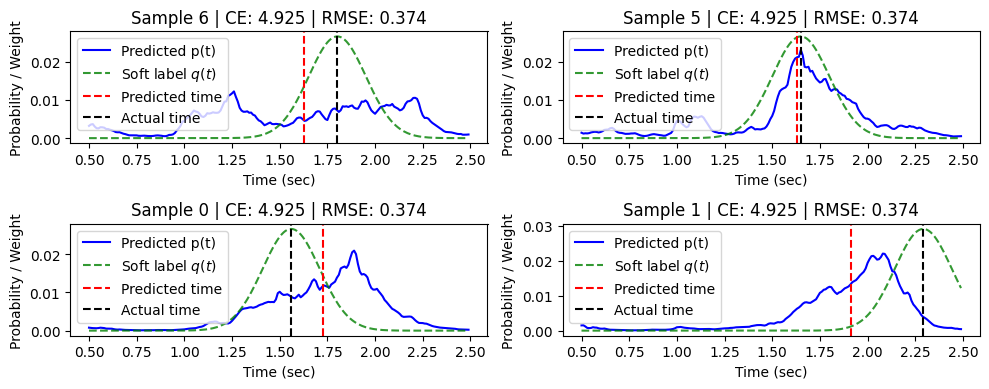

Epoch 73/200: 

Epoch 73 [31/31] Loss 5.0221 CE 5.0221 RMSE 0.3848 KL 0.0000 WASS 0.0000 NRMSE 0.9495 Entropy 4.843: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9495 Total loss: 155.9931 Total CE: 155.9931 Total RMSE: 12.1258 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7197 RMSE@τ=0.75 0.3741 NRMSE 0.9228: 100%|██████████| 91/91 [00:04<00:00, 21.45it/s]

Val (τ*) 0.750 | NRMSE: 922.782, CE: 4.923912, RMSE(s): 0.374137, bias(s): 0.020761


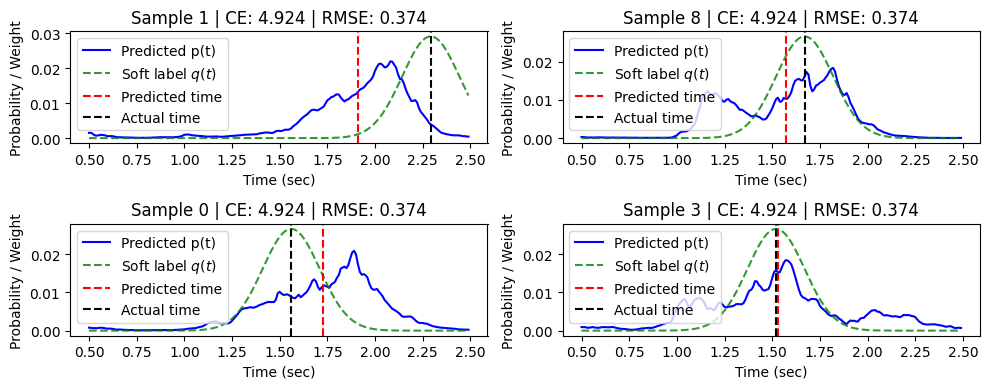

Epoch 74/200: 

Epoch 74 [31/31] Loss 5.0191 CE 5.0191 RMSE 0.3765 KL 0.0000 WASS 0.0000 NRMSE 0.9501 Entropy 4.837: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9501 Total loss: 156.0678 Total CE: 156.0678 Total RMSE: 12.1304 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7194 RMSE@τ=0.75 0.3741 NRMSE 0.9228: 100%|██████████| 91/91 [00:04<00:00, 21.40it/s]

Val (τ*) 0.750 | NRMSE: 922.801, CE: 4.922955, RMSE(s): 0.374145, bias(s): 0.020812


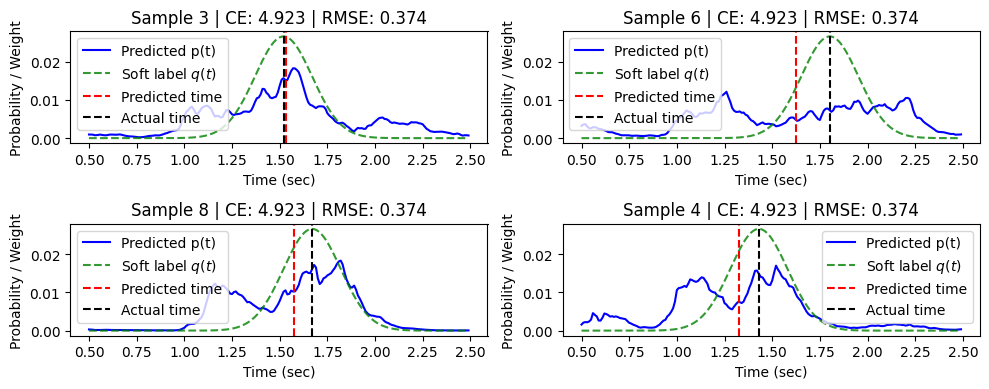

Epoch 75/200: 

Epoch 75 [31/31] Loss 5.0560 CE 5.0560 RMSE 0.3929 KL 0.0000 WASS 0.0000 NRMSE 0.9500 Entropy 4.905: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9500 Total loss: 156.0783 Total CE: 156.0783 Total RMSE: 12.1210 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7189 RMSE@τ=0.75 0.3742 NRMSE 0.9229: 100%|██████████| 91/91 [00:04<00:00, 20.99it/s]

Val (τ*) 0.750 | NRMSE: 922.868, CE: 4.921989, RMSE(s): 0.374172, bias(s): 0.020967


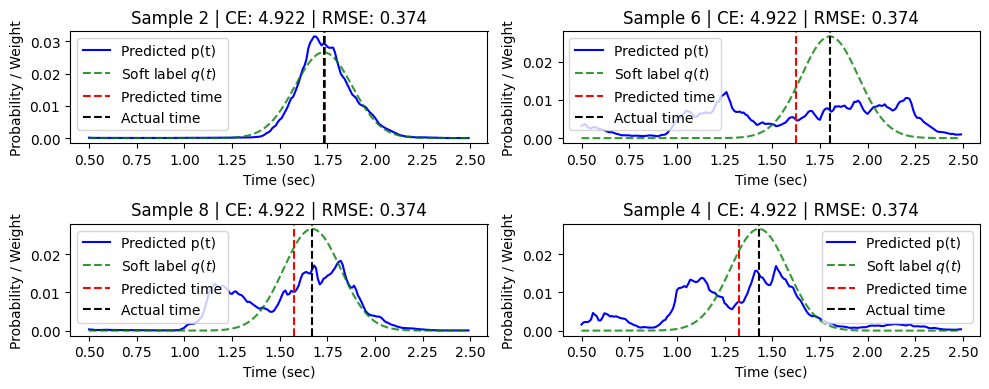

Epoch 76/200: 

Epoch 76 [31/31] Loss 5.0003 CE 5.0003 RMSE 0.3783 KL 0.0000 WASS 0.0000 NRMSE 0.9475 Entropy 4.831: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9475 Total loss: 155.8173 Total CE: 155.8173 Total RMSE: 12.0907 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7193 RMSE@τ=0.75 0.3741 NRMSE 0.9227: 100%|██████████| 91/91 [00:04<00:00, 21.50it/s]

Val (τ*) 0.750 | NRMSE: 922.729, CE: 4.921154, RMSE(s): 0.374115, bias(s): 0.020729


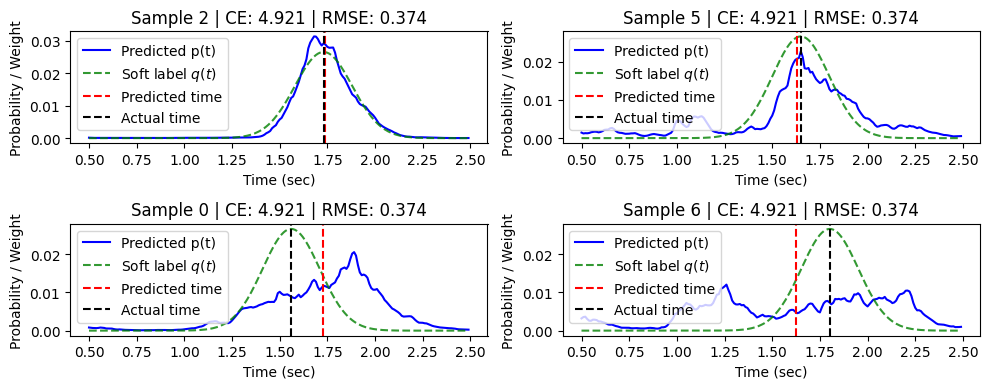

Epoch 77/200: 

Epoch 77 [31/31] Loss 5.0211 CE 5.0211 RMSE 0.3939 KL 0.0000 WASS 0.0000 NRMSE 0.9513 Entropy 4.906: 100%|██████████| 31/31 [00:14<00:00,  2.07it/s]

NRMSE: 0.9513 Total loss: 156.0242 Total CE: 156.0242 Total RMSE: 12.1573 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7191 RMSE@τ=0.75 0.3741 NRMSE 0.9227: 100%|██████████| 91/91 [00:04<00:00, 21.34it/s]

Val (τ*) 0.750 | NRMSE: 922.748, CE: 4.920285, RMSE(s): 0.374123, bias(s): 0.020785


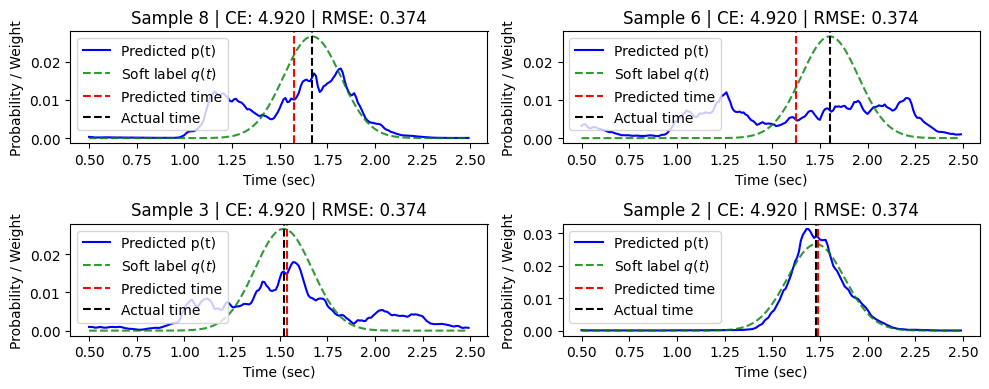

Epoch 78/200: 

Epoch 78 [31/31] Loss 5.0418 CE 5.0418 RMSE 0.3933 KL 0.0000 WASS 0.0000 NRMSE 0.9503 Entropy 4.912: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9503 Total loss: 155.9922 Total CE: 155.9922 Total RMSE: 12.1383 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7192 RMSE@τ=0.75 0.3741 NRMSE 0.9227: 100%|██████████| 91/91 [00:04<00:00, 21.32it/s]

Val (τ*) 0.750 | NRMSE: 922.729, CE: 4.919522, RMSE(s): 0.374115, bias(s): 0.020742


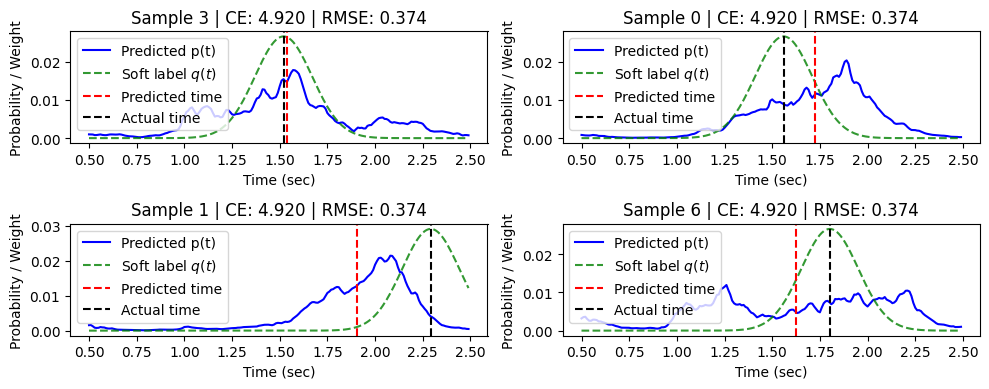

Epoch 79/200: 

Epoch 79 [31/31] Loss 5.0109 CE 5.0109 RMSE 0.3845 KL 0.0000 WASS 0.0000 NRMSE 0.9507 Entropy 4.840: 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]

NRMSE: 0.9507 Total loss: 155.9328 Total CE: 155.9328 Total RMSE: 12.1276 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7193 RMSE@τ=0.75 0.3741 NRMSE 0.9227: 100%|██████████| 91/91 [00:04<00:00, 21.31it/s]

Val (τ*) 0.750 | NRMSE: 922.691, CE: 4.918718, RMSE(s): 0.374100, bias(s): 0.020688


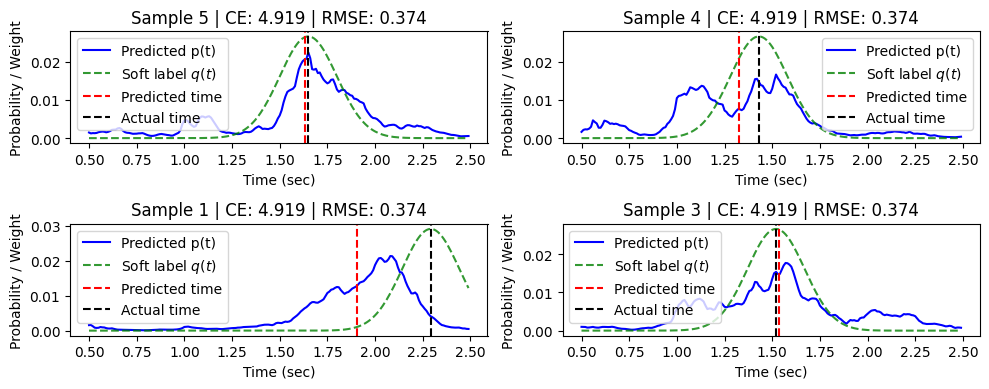

Epoch 80/200: 

Epoch 80 [31/31] Loss 5.0123 CE 5.0123 RMSE 0.3942 KL 0.0000 WASS 0.0000 NRMSE 0.9495 Entropy 4.852: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9495 Total loss: 155.9309 Total CE: 155.9309 Total RMSE: 12.1284 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7193 RMSE@τ=0.75 0.3741 NRMSE 0.9226: 100%|██████████| 91/91 [00:04<00:00, 21.20it/s]

Val (τ*) 0.750 | NRMSE: 922.646, CE: 4.917997, RMSE(s): 0.374082, bias(s): 0.020594


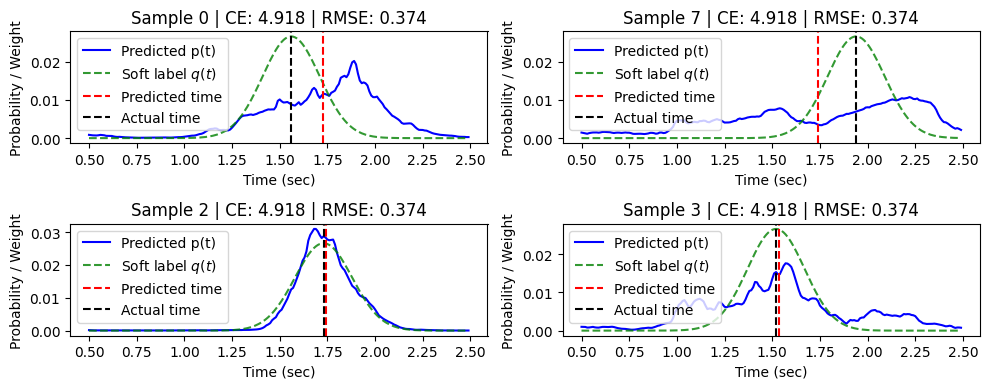

Restart from checkpoint ../artefacts/models/challenge_1/inception_v0.pth. Best Val NRMSE: 916.920839 (epoch None)
Updating learning rate 1.25e-05 -> 6.25e-06
Epoch 81/200: 

Epoch 81 [31/31] Loss 5.0485 CE 5.0485 RMSE 0.3934 KL 0.0000 WASS 0.0000 NRMSE 0.9518 Entropy 4.804: 100%|██████████| 31/31 [00:14<00:00,  2.10it/s]

NRMSE: 0.9518 Total loss: 156.4485 Total CE: 156.4485 Total RMSE: 12.1585 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7536 RMSE@τ=0.75 0.3739 NRMSE 0.9221: 100%|██████████| 91/91 [00:04<00:00, 21.64it/s]

Val (τ*) 0.750 | NRMSE: 922.132, CE: 4.948027, RMSE(s): 0.373873, bias(s): 0.017749


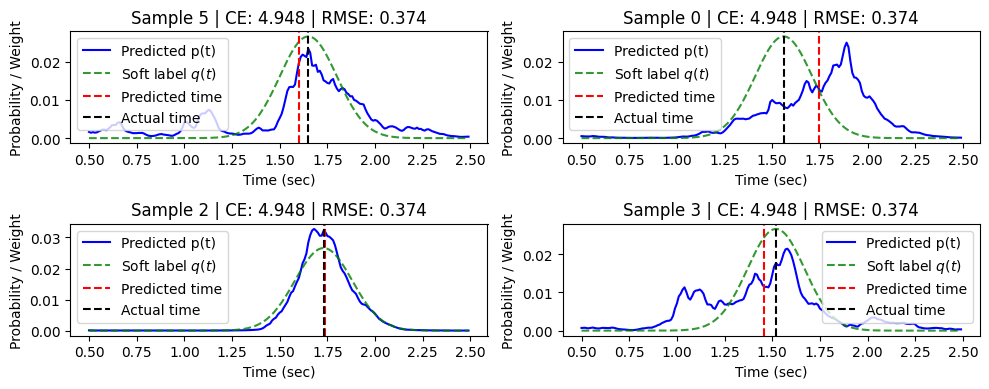

Epoch 82/200: 

Epoch 82 [31/31] Loss 5.0529 CE 5.0529 RMSE 0.3992 KL 0.0000 WASS 0.0000 NRMSE 0.9495 Entropy 4.788: 100%|██████████| 31/31 [00:14<00:00,  2.15it/s]

NRMSE: 0.9495 Total loss: 156.4273 Total CE: 156.4273 Total RMSE: 12.1318 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7391 RMSE@τ=0.75 0.3739 NRMSE 0.9223: 100%|██████████| 91/91 [00:04<00:00, 21.24it/s]

Val (τ*) 0.750 | NRMSE: 922.277, CE: 4.942999, RMSE(s): 0.373932, bias(s): 0.019111


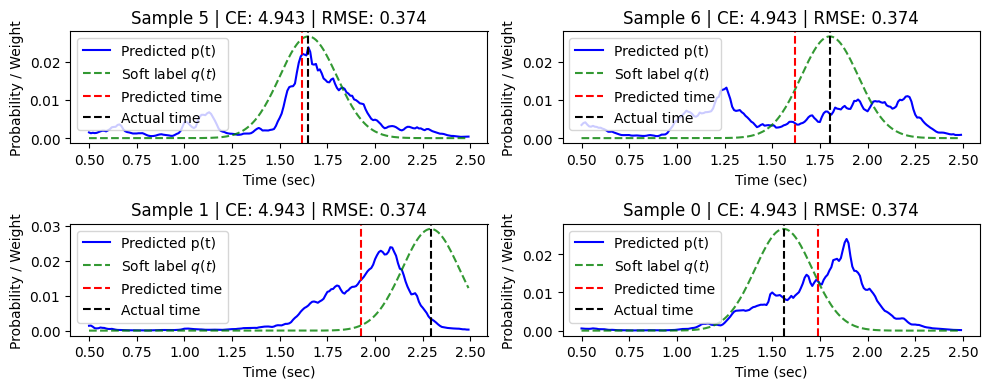

Epoch 83/200: 

Epoch 83 [31/31] Loss 5.0317 CE 5.0317 RMSE 0.3813 KL 0.0000 WASS 0.0000 NRMSE 0.9502 Entropy 4.799: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

NRMSE: 0.9502 Total loss: 156.4268 Total CE: 156.4268 Total RMSE: 12.1481 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7314 RMSE@τ=0.75 0.3740 NRMSE 0.9225: 100%|██████████| 91/91 [00:04<00:00, 20.91it/s]

Val (τ*) 0.750 | NRMSE: 922.508, CE: 4.939889, RMSE(s): 0.374026, bias(s): 0.019977


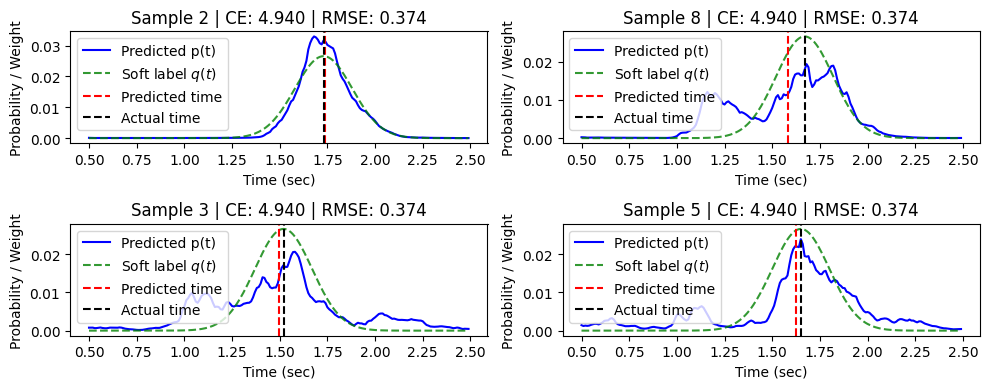

Epoch 84/200: 

Epoch 84 [31/31] Loss 5.0527 CE 5.0527 RMSE 0.3841 KL 0.0000 WASS 0.0000 NRMSE 0.9538 Entropy 4.875: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9538 Total loss: 156.4733 Total CE: 156.4733 Total RMSE: 12.1880 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7259 RMSE@τ=0.75 0.3742 NRMSE 0.9228: 100%|██████████| 91/91 [00:04<00:00, 21.13it/s]

Val (τ*) 0.750 | NRMSE: 922.826, CE: 4.937636, RMSE(s): 0.374155, bias(s): 0.020771


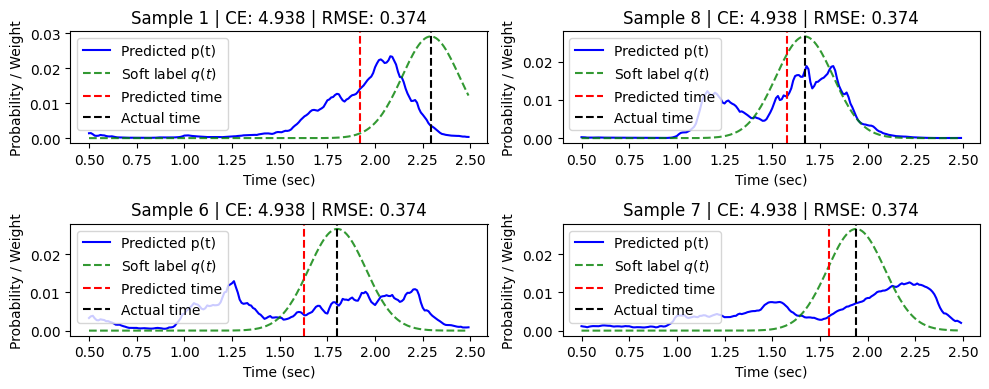

Epoch 85/200: 

Epoch 85 [31/31] Loss 5.0565 CE 5.0565 RMSE 0.4036 KL 0.0000 WASS 0.0000 NRMSE 0.9497 Entropy 4.872: 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]

NRMSE: 0.9497 Total loss: 156.3986 Total CE: 156.3986 Total RMSE: 12.1223 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7226 RMSE@τ=0.75 0.3743 NRMSE 0.9231: 100%|██████████| 91/91 [00:04<00:00, 21.19it/s]

Val (τ*) 0.750 | NRMSE: 923.090, CE: 4.936144, RMSE(s): 0.374262, bias(s): 0.021282


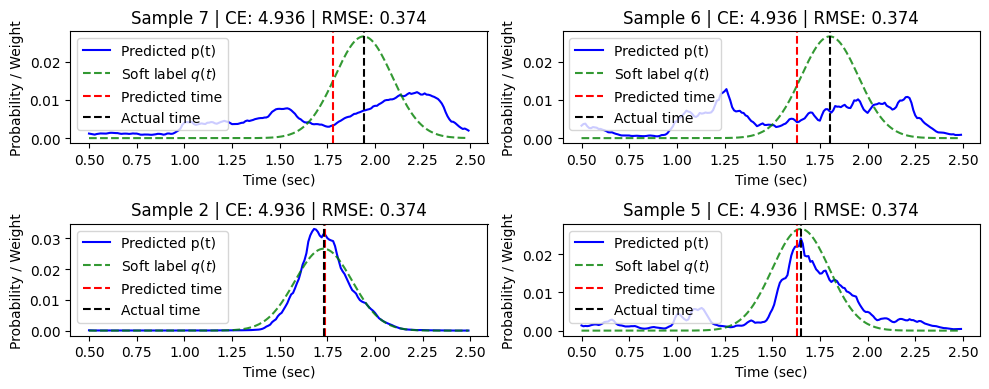

Epoch 86/200: 

Epoch 86 [31/31] Loss 5.0416 CE 5.0416 RMSE 0.3958 KL 0.0000 WASS 0.0000 NRMSE 0.9499 Entropy 4.809: 100%|██████████| 31/31 [00:14<00:00,  2.14it/s]

NRMSE: 0.9499 Total loss: 156.3432 Total CE: 156.3432 Total RMSE: 12.1364 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7215 RMSE@τ=0.75 0.3743 NRMSE 0.9232: 100%|██████████| 91/91 [00:04<00:00, 21.34it/s]

Val (τ*) 0.750 | NRMSE: 923.172, CE: 4.935211, RMSE(s): 0.374295, bias(s): 0.021348


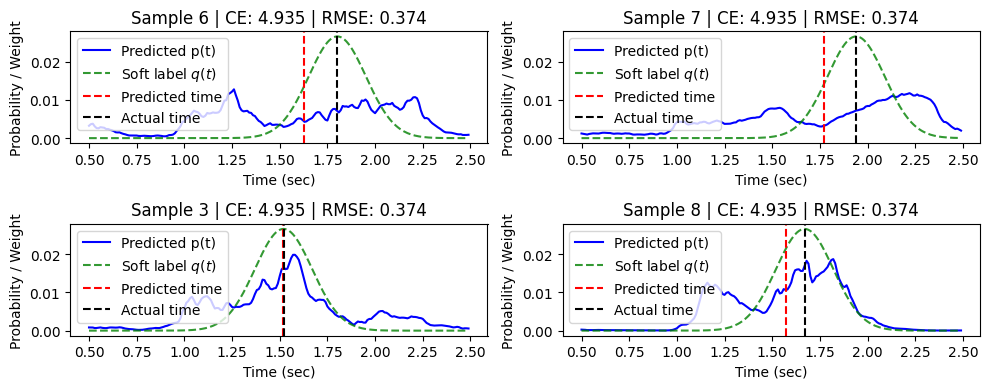

Epoch 87/200: 

Epoch 87 [31/31] Loss 5.0448 CE 5.0448 RMSE 0.3910 KL 0.0000 WASS 0.0000 NRMSE 0.9477 Entropy 4.871: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9477 Total loss: 156.2869 Total CE: 156.2869 Total RMSE: 12.0982 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7210 RMSE@τ=0.75 0.3743 NRMSE 0.9232: 100%|██████████| 91/91 [00:04<00:00, 21.35it/s]

Val (τ*) 0.750 | NRMSE: 923.223, CE: 4.934379, RMSE(s): 0.374316, bias(s): 0.021394


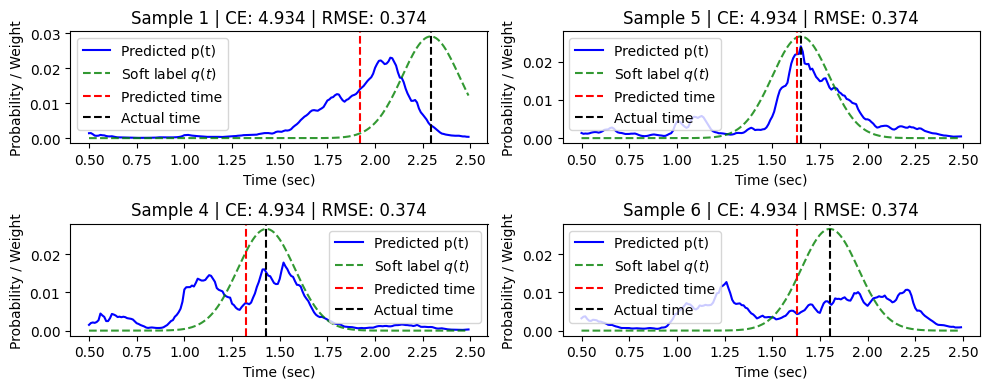

Epoch 88/200: 

Epoch 88 [31/31] Loss 5.0366 CE 5.0366 RMSE 0.3919 KL 0.0000 WASS 0.0000 NRMSE 0.9500 Entropy 4.817: 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]

NRMSE: 0.9500 Total loss: 156.2905 Total CE: 156.2905 Total RMSE: 12.1351 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7203 RMSE@τ=0.75 0.3744 NRMSE 0.9233: 100%|██████████| 91/91 [00:04<00:00, 20.86it/s]

Val (τ*) 0.750 | NRMSE: 923.310, CE: 4.933577, RMSE(s): 0.374351, bias(s): 0.021521


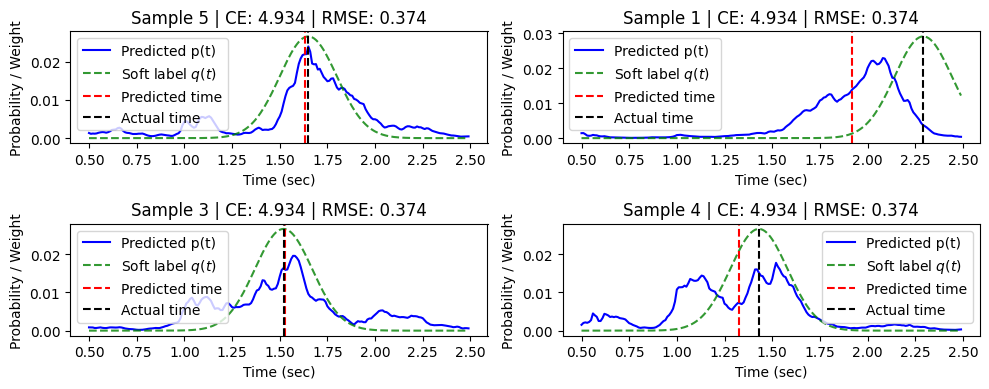

Epoch 89/200: 

Epoch 89 [31/31] Loss 5.0251 CE 5.0251 RMSE 0.3834 KL 0.0000 WASS 0.0000 NRMSE 0.9525 Entropy 4.808: 100%|██████████| 31/31 [00:24<00:00,  1.28it/s]

NRMSE: 0.9525 Total loss: 156.3467 Total CE: 156.3467 Total RMSE: 12.1594 Total KL: 0.0000 Total WASS: 0.0000



Val [91/91] CE 4.7198 RMSE@τ=0.75 0.3744 NRMSE 0.9234: 100%|██████████| 91/91 [00:08<00:00, 10.25it/s]

Val (τ*) 0.750 | NRMSE: 923.381, CE: 4.932783, RMSE(s): 0.374380, bias(s): 0.021656


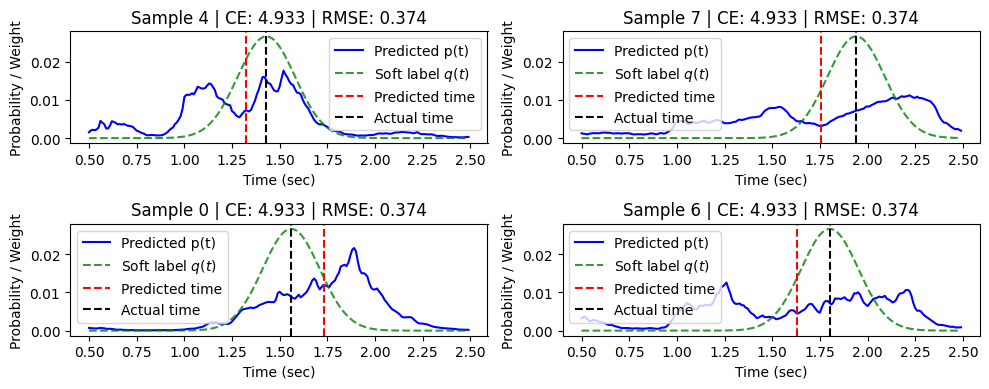

Epoch 90/200: 

Epoch 90 [24/31] Loss 5.0405 CE 5.0405 RMSE 0.3892 KL 0.0000 WASS 0.0000 NRMSE 0.9513 Entropy 4.807:  77%|███████▋  | 24/31 [00:23<00:06,  1.00it/s]


KeyboardInterrupt: 

In [11]:
import copy

finetune_mode = True
# use_augmentation = True if finetune_mode else True
# initial_lr = 1E-3 if finetune_mode else 1E-2
# weight_decay = 0 if finetune_mode else 0
# optimizer_module = torch.optim.SGD if finetune_mode else torch.optim.Adam
# batch_size = 2000 if finetune_mode else 2800
# sigma = 0.13 if finetune_mode else 0.2 # 0.13
# cropping_offset = 0.3 if finetune_mode else 0.2
# crop_proba = 0.1 if finetune_mode else 0.2
# mixup_p = 0.8 if finetune_mode else 0.25 #0.8 
# temperature = 1. if finetune_mode else 1.0
# lambda_time = 5. if finetune_mode else 0 # 5
# lambda_wass = 0.0 if finetune_mode else 0 # 0.001
# lambda_kl = 0. if finetune_mode else 0

use_augmentation = True if finetune_mode else True
initial_lr = 1E-4 if finetune_mode else 0.001
weight_decay = 0 if finetune_mode else 0
optimizer_module = torch.optim.SGD if finetune_mode else torch.optim.Adam
batch_size = 3000 if finetune_mode else 3000
sigma = 0.15 if finetune_mode else 0.15 # 0.13
cropping_offset = 0.2 if finetune_mode else 0.25
crop_proba = 0.1 if finetune_mode else 0.3
dropout_proba = 0.3 if finetune_mode else 0.25
dropout_range = 0.2 if finetune_mode else 0.8
mixup_p = 0.5 if finetune_mode else 0.1 #0.8 
temperature = 0.75 if finetune_mode else 0.65 # 0.7
lambda_time = 0 if finetune_mode else 3. # 5
lambda_ce = 1.0 if finetune_mode else 0 # 1
lambda_wass = 0.0 if finetune_mode else 0. # 0.001
lambda_kl = 0. if finetune_mode else 0
lambda_entropy = -0.0 if finetune_mode else 0
lambda_focal = 0.
lambda_hazard = 0.0
grad_accum = 1

train_cropping_dataset = TrainCroppingDataset(
    train_dataset, sfreq=100, crop_sec=2.0, sigma=sigma, use_channels=channels_list, end_time=3,
    use_augmentation=use_augmentation, cropping_offset=cropping_offset, crop_proba=crop_proba,
    dropout_proba=dropout_proba, dropout_range=dropout_proba
)
train_loader = DataLoader(
    train_cropping_dataset, batch_size=batch_size, shuffle=True, num_workers=8, 
    # pin_memory=True, persistent_workers=True, prefetch_factor=4
)
current_lr = initial_lr
optimizer = optimizer_module(model.parameters(), lr=current_lr, weight_decay=weight_decay)

for epoch in range(1, n_epochs + 1):
    print(f"Epoch {epoch}/{n_epochs}: ", end="")

    train_loss, train_nrmse, train_loss_dict = train_one_epoch(
        train_loader, model, optimizer, epoch, device,
        mixup_p=mixup_p, 
        # lambda_time=time_lambda, lambda_kl=0.5, lambda_wass=0.5,
        lambda_time=lambda_time, lambda_kl=lambda_kl, lambda_wass=lambda_wass,
        lambda_entropy = lambda_entropy, lambda_focal=lambda_focal,
        lambda_hazard=lambda_hazard,
        temperature=temperature, grad_accum=grad_accum,
    )

    val_preds, val_loss, val_nrmse, val_ce, val_mse, best_tau = valid_model(
        valid_loader, model, device, sigma=sigma,
        lambda_time=1., temperature=temperature,
        channels_list=channels_list, default_rmse=default_rmse_valid,
        plot_last_batch=True,
        use_soft_argmax=True, calibrate_temperature=False
    )

    if val_nrmse < best_rmse:
        print(f"New best validation NRMSE: {val_nrmse:.6f} at epoch {epoch}")
        best_rmse = val_nrmse
        best_state = copy.deepcopy(model.state_dict())
        best_epoch = epoch
        epochs_no_improve = 0
        torch.save(model.state_dict(), output_checkpoint_path)
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= early_stopping_patience:
            current_checkpoint_path = output_checkpoint_path if os.path.exists(output_checkpoint_path) else input_checkpoint_path
            print(f"Restart from checkpoint {current_checkpoint_path}. Best Val NRMSE: {best_rmse:.6f} (epoch {best_epoch})")
            print(f"Updating learning rate {current_lr} -> {current_lr * 0.5}")
            model.load_state_dict(torch.load(current_checkpoint_path))
            current_lr = current_lr * 0.5
            optimizer = optimizer_module(model.parameters(), lr=current_lr, weight_decay=weight_decay)
            epochs_no_improve = 0